<a href="https://colab.research.google.com/github/Legacy560/MTLSA25-Sales-Forecasting-Project/blob/main/M5_Report_MLTSA25_SalesForecasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Initial Imports

In [ ]:
# @title
# # #Remove
# # Uninstall numpy, scipy, and scikit-learn
# !pip uninstall numpy scipy scikit-learn -y

# # Install a specific, compatible version of numpy
# !pip install numpy==1.24.3

# # Reinstall scipy and scikit-learn
# !pip install scipy scikit-learn

# # Install pmdarima
# !pip install pmdarima

In [ ]:
# @title
#Remove
#The last cell will ask you to restart the session after it runs. Restart it, then run this cell. After that, run the imports below.
!pip install pmdarima

!pip install --no-cache-dir pmdarima --quiet

In [ ]:
# @title
# Remove
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import pmdarima as pm
import pylab as pl
import json
import os
import warnings
import dask.dataframe as dd
from statsmodels.tsa.stattools import adfuller

from statsmodels.tsa.arima.model import ARIMA
warnings.filterwarnings('ignore')
%pylab inline

import torch
import torch.nn as nn
import time
import math


Populating the interactive namespace from numpy and matplotlib


# M5 Sales Forecasting: ARIMA vs Transformer Approaches


---



## Abstract

In this project, we forecast item-level retail sales using the M5 competition dataset from Kaggle. Our approach employs two classical time series models: ARIMA and Transfer Function models (implemented via SARIMAX). The objective is to evaluate their predictive accuracy, interpretability, and applicability for real-world retail forecasting. We explore the strengths and weaknesses of these models using both intrinsic time series patterns and external features such as calendar events and promotional activities. This study provides insights into the capabilities of classical forecasting models in the context of modern, high-frequency sales data.



## Introduction
Sales forecasting is a critical task in retail, enabling businesses to optimize inventory, streamline operations, and make informed strategic decisions. The M5 Forecasting Competition, hosted on Kaggle, provides a rich dataset from Walmart, challenging participants to predict daily sales for various products across multiple stores. This report details the process of building and comparing two forecasting models—ARIMA (AutoRegressive Integrated Moving Average) and a Transformer-based neural network—to predict sales for the M5 dataset. Our goal is to evaluate the strengths and weaknesses of these models, providing insights into their applicability for time-series forecasting in retail.

The M5 dataset includes sales data for 30,490 unique product-store combinations over 1,941 days, supplemented by calendar events and sell prices. We aim to forecast the next 28 days of sales for a subset of products, comparing the traditional statistical approach (ARIMA) with a modern deep learning approach (Transformer). This report covers data acquisition, preprocessing, model implementation, training, evaluation, and a detailed comparison of the two models.

In [ ]:
# @title
# Remove
from google.colab import drive

drive.mount("/content/gdrive")


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# @title
cd /content/gdrive/Shareddrives/MLTSA25-Sales-Forecasting/Project

/content/gdrive/Shareddrives/MLTSA25-Sales-Forecasting/Project


## Data Acquisition

We begin by acquiring the M5 dataset from Kaggle. The following steps outline the process:

* Kaggle API Setup: We configure the Kaggle API by setting environment variables for the username and key, stored in a kaggle.json file.

* Dataset Download: Using the Kaggle API, we download the m5-forecasting-accuracy competition dataset and unzip it to access the following files:
	* calendar.csv: Contains calendar information.

		Includes columns like date, wm_yr_wk, weekday, wday, month, year, event_name_1, event_type_1, snap_CA, snap_TX, and snap_WI. The snap_ columns indicate SNAP (Supplemental Nutrition Assistance Program) days, which may influence sales.
	* sell_prices.csv: Contains weekly sell prices.

		Contains store_id, item_id, wm_yr_wk, and sell_price, linking prices to specific products and weeks.
	* sales_train_validation.csv: Contains sales data for 1,913 days.

		Contains the historical daily unit sales of 30,490 Walmart products across 10 stores in 3 states.
	* sales_train_evaluation.csv: Extends the sales data to 1,941 days.


$$
\begin{array}{|c|c|c|c|c|c|c|}
\hline
Dataset & URL & Rows & Column & Relevent\ Columns & Valid\ Rows & Data\ Types \\
\hline
sales\_train\_validation.csv & https://www.kaggle.com/competitions/m5-forecasting-accuracy/data & 30490 & 1919 & id,\ item\_id,\ store\_id, d\_1\ to\ d\_1913 & All & String,\ Int\\
calendar.csv & https://www.kaggle.com/competitions/m5-forecasting-accuracy/data & 1969 & 14 & \ event\_name\_1,\ snap\_CA & All & Date,\ String,\ Int \\
sell\_prices.csv & https://www.kaggle.com/competitions/m5-forecasting-accuracy/data & 6841121 & 4 & store\_id,\ item\_id,\ wm\_yr\_wk,\ sell\_price & All & String,\ Float\\
\hline
\end{array}
$$


##  Data Preprocessing

Data Reshaping and Merging

Effective preprocessing is crucial for time-series forecasting. We perform the following steps to prepare the data for both ARIMA and Transformer models.

1. Reshape Sales Data to Long Format

The sales data is initially in wide format, with each day as a separate column (d_1, d_2, …, d_1913). We convert it to long format using pandas.melt so that each row corresponds to one product on one day.

Wide Format:
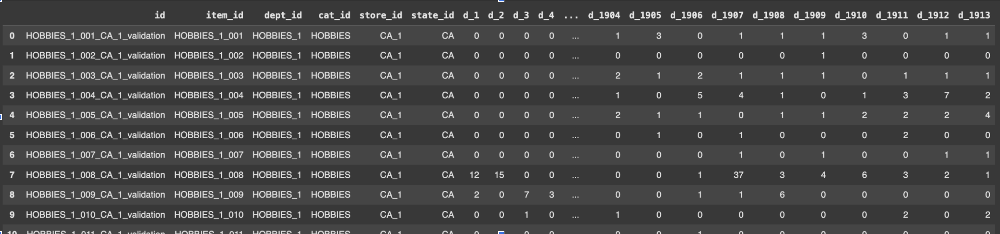

Long Format:
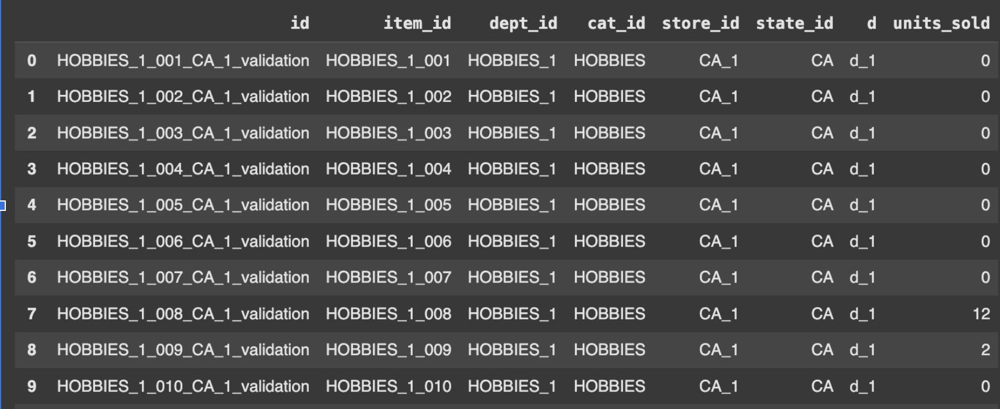

2. Downcasting:
To reduce memory usage, I applied a custom downcast() function that iteratively converts DataFrame columns to more memory-efficient types. For numeric columns, it selects the smallest integer or float type that can safely represent the data range. For object columns, it attempts conversion to datetime (if the name suggests it's a date) or to category type when the number of unique values is relatively low. This approach significantly reduces the memory footprint without affecting data integrity, as the plot below shows.

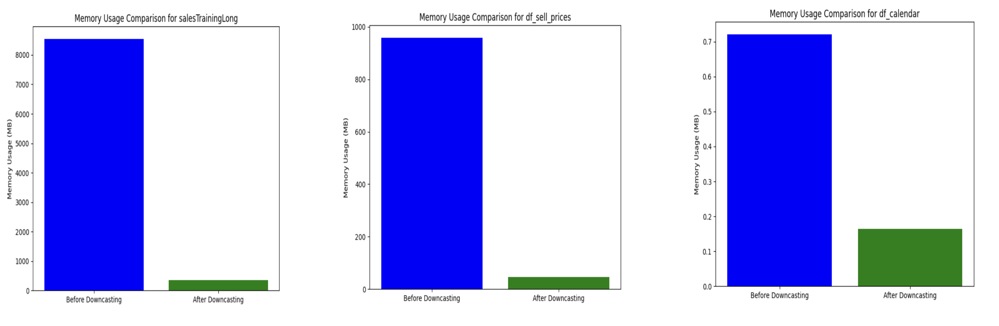

3. Merge with Calendar Data

The calendar.csv file contains useful date information, including actual dates, event names, and SNAP flags. We merge this into the long-format sales data to enrich it with temporal features.



4. Price Integration

We merge the sell prices using store_id, item_id, and wm_yr_wk, filling missing prices with forward-fill and backward-fill methods to handle gaps.


After merging and reshaping:

*	Each row represents a single product on a single date.
*	The dataset is ready for time series modeling, with added features like event markers and SNAP status.


Final Dataframe:

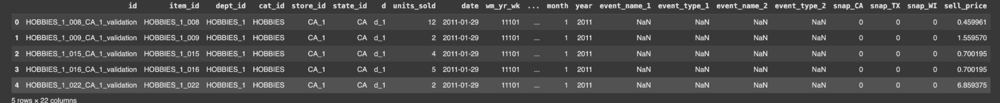


5. Visualization

Before modeling, we visualize the time series to understand sales dynamics. We plotted each of the 10 time series as well as a heatmap on the correlation matrix for the daily sales.

In [ ]:
# @title
# Remove
#Import the datasets (All aforementioned preproessing accounted for)
salesFull = pd.read_csv("salesFull.csv")
salesEvalFull = pd.read_csv("salesEvalFull.csv")

#change the index to the id column
salesFull.set_index('id', inplace=True)
salesEvalFull.set_index('id', inplace=True)

#Sort the row indices in salesEvalFull so they match the order in salesFull
salesEvalFull = salesEvalFull.reindex(salesFull.index)

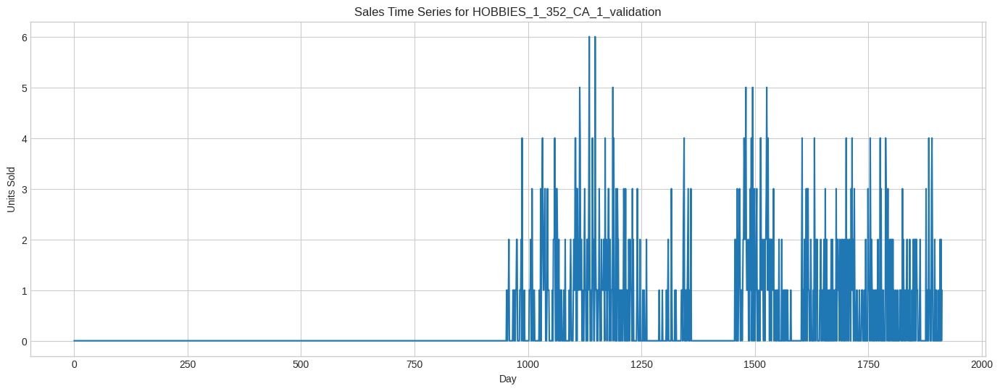

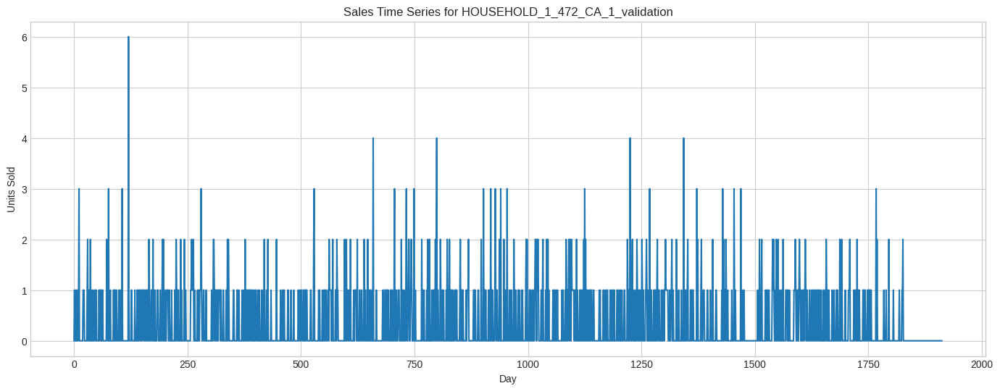

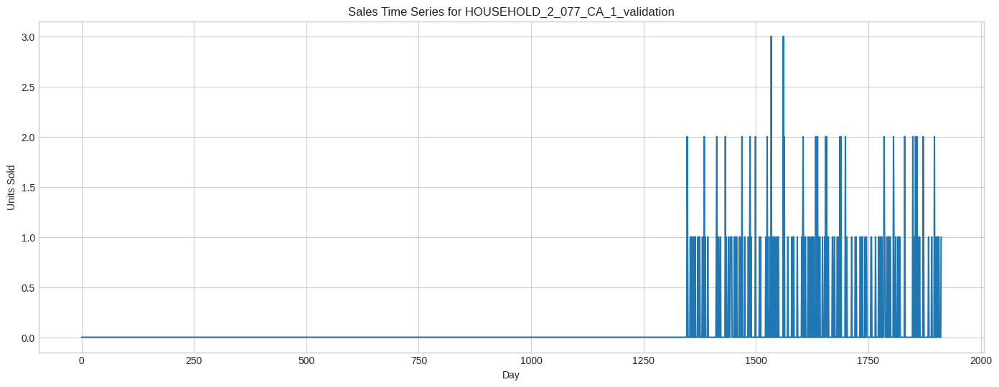

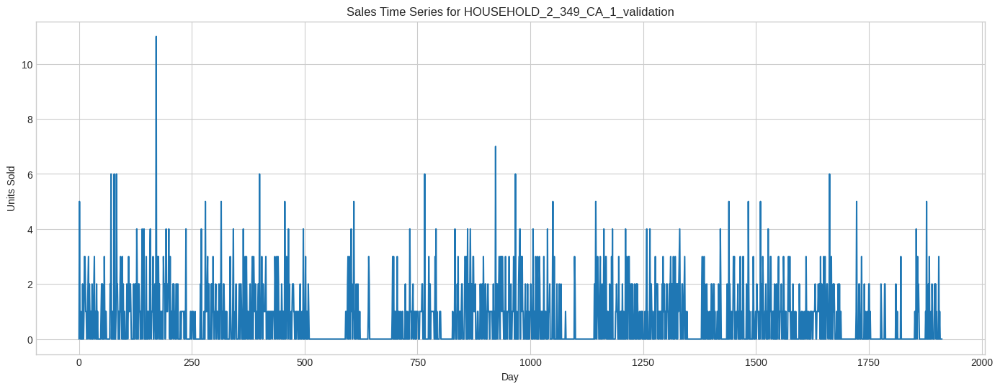

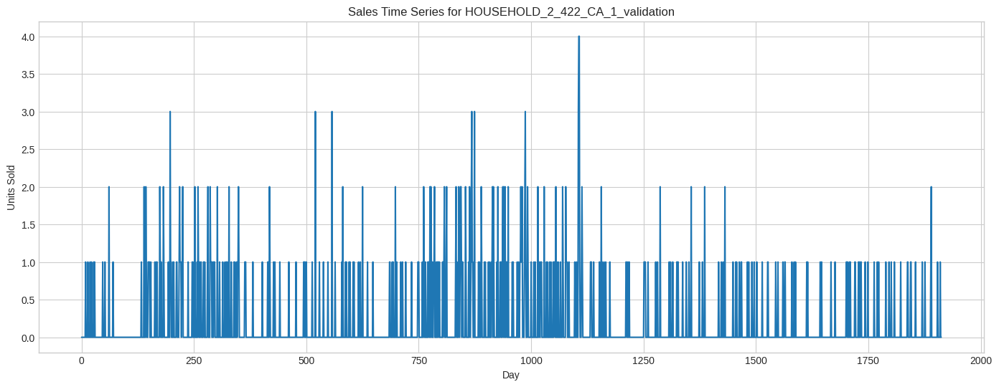

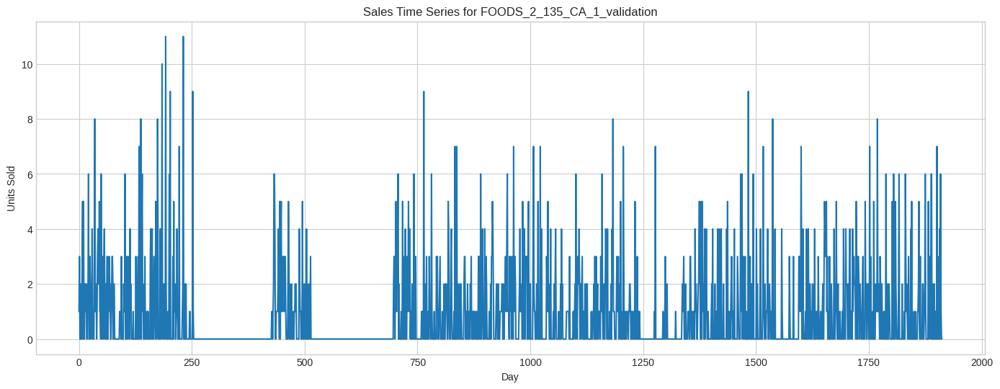

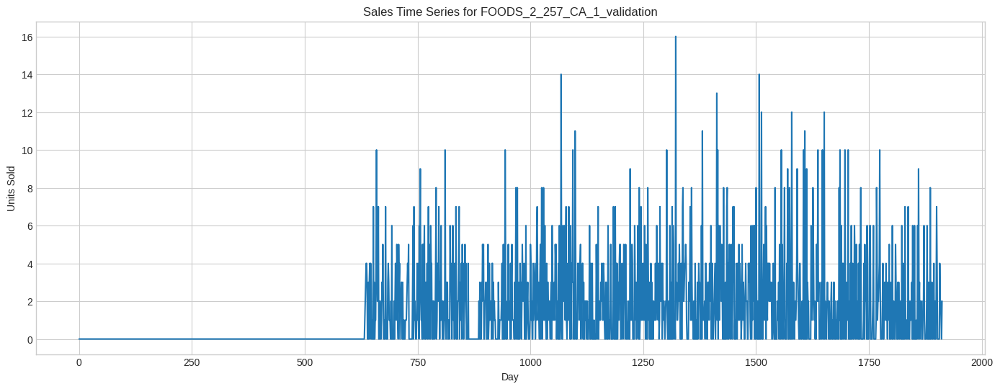

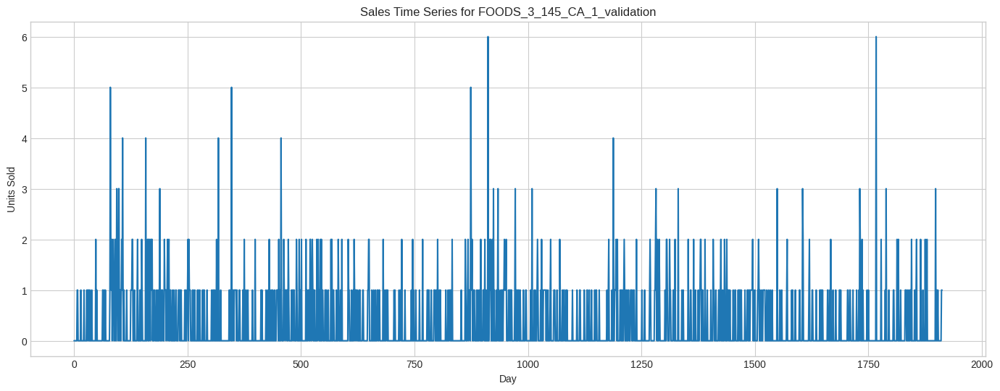

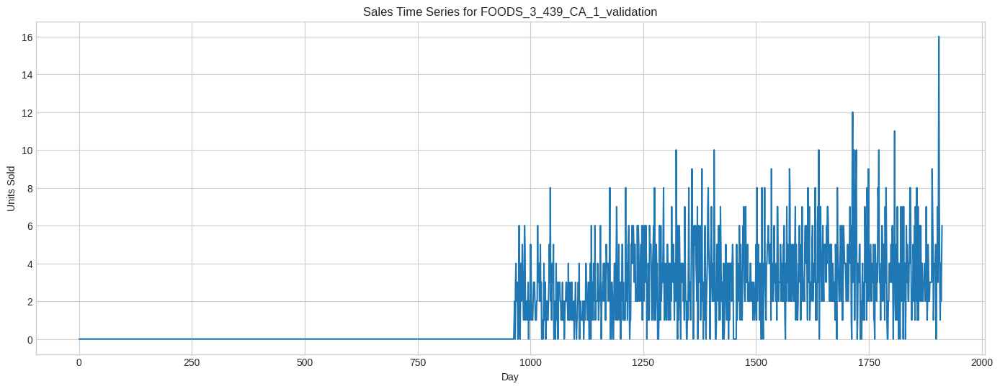

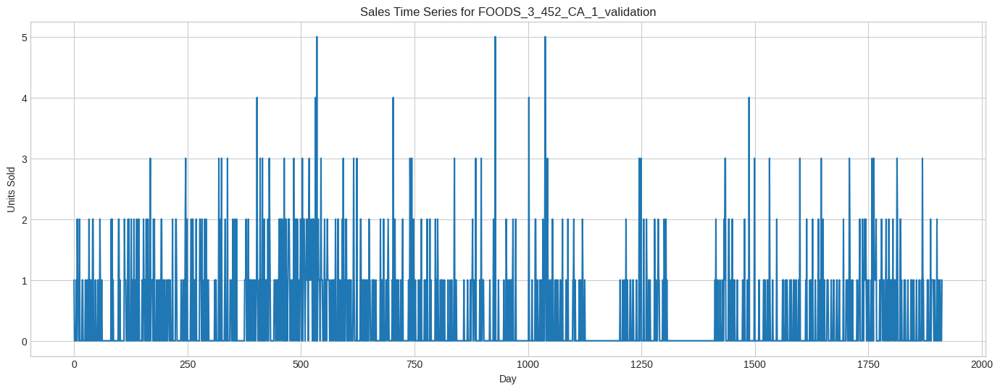

In [ ]:
# @title
# Remove
#Define a function to plot each of the 10 time series in SalesFull
def plotTS(dataset):
  '''
  Takes in a wide dataset and plots each of its time series (in each row).
  Inputs:
    dataset - The wide dataset containing the time series to be plotted.
  Returns:
    None
  '''
  #Get the column names
  cols = list(dataset.columns)
  # Explicitly reset matplotlib style
  plt.style.use('seaborn-v0_8-whitegrid') # Or try 'classic', 'ggplot', etc. or just remove this line entirely
  for index, row in dataset.iterrows():
    plt.figure(figsize=(17, 6))
    plot(row.values)

    plt.xlabel('Day')
    plt.ylabel('Units Sold')
    plt.title(f'Sales Time Series for {index}')
    plt.grid(True)
    #plt.gcf().autofmt_xdate()
    plt.show()
plotTS(salesFull)

5. Heatmap of Correlation Matrix for salesFull:

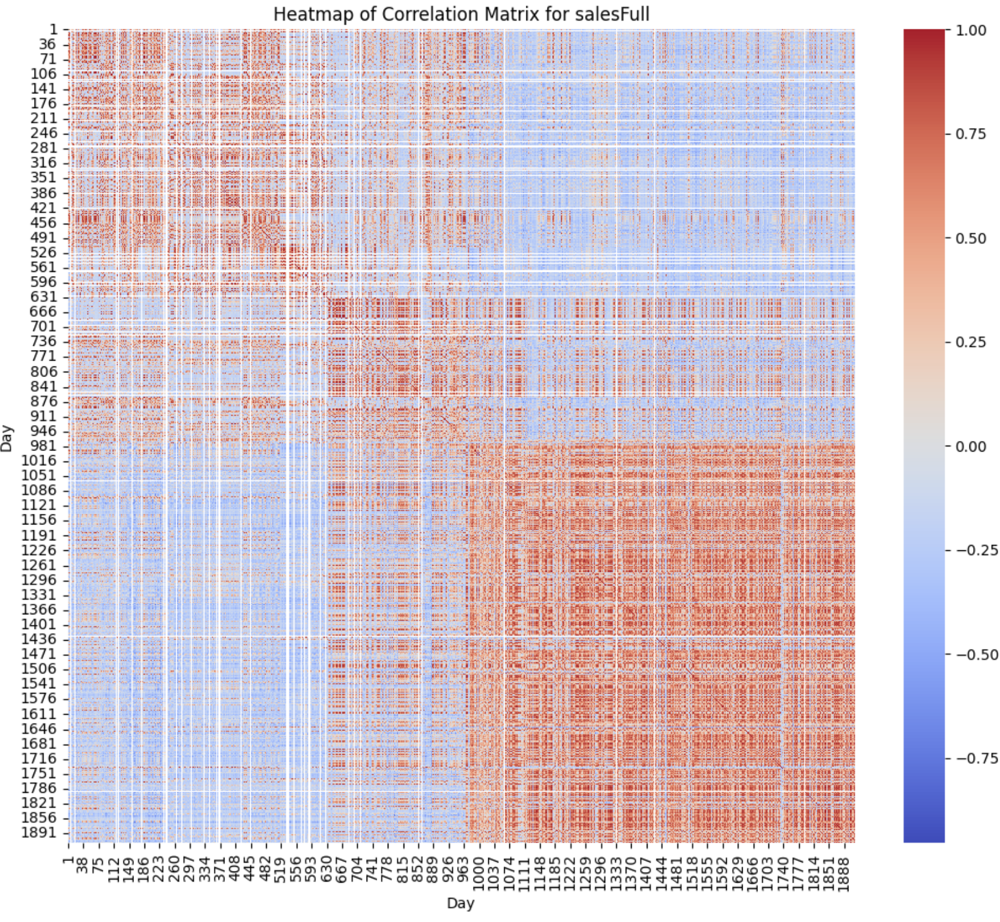

From the above plots, we see that each series is very sparse and exhibits minimal variation. We believe that these kinds of time series played a significant role in the faiure of our models, as we will explain later in the report.

The heatmap indicates that sales behavior shifted significantly at a certain point in time. Earlier and later periods show distinct correlation patterns, hinting at a seasonal change in sales strategy.



## Model Implementation
1. ARIMA Model

ARIMA is a classical time-series forecasting model combining autoregression (AR), differencing (I), and moving average (MA) components. We use the pmdarima library to automate ARIMA parameter selection.

Implementation Steps

* Stationarity Check: We applied the Augmented Dickey-Fuller (ADF) test. The p-value was >0.05, indicating non-stationarity. First-order differencing was applied.

* Order Selection: We used auto_arima from the pmdarima library to automatically select optimal (p, d, q) values using a stepwise grid search.

* Model Training: The ARIMA model was trained on 90% of the data.

* Forecasting: Predictions were generated for the test period (last 10% of the data).

* Evaluation: Forecast accuracy was measured using RMSE and visually via overlay plots.

An ARIMA model was fitted to each time series from our sample of 10 products. The following 2 figures illustrate the results from our forecasting analysis

In [ ]:
arima_models = {}

for index, row in salesFull.iterrows():
    product_id = index  # 'id' is the index after pivoting
    series = row.values # The values for the time series

    # Use auto_arima to find the best ARIMA model parameters
    model = pm.auto_arima(series,
                          seasonal=False,       # Set to True if you expect seasonality
                          m=5,                # Set seasonal period (e.g., 7 for weekly)
                          stepwise=True,
                          suppress_warnings=True,
                          error_action='ignore',
                          trace=True,
                          start_p=0, start_q=0, max_p=3, max_q=3) # Set trace to True to see the progress

    # Store the fitted model
    arima_models[product_id] = model
    print(f"Fitted ARIMA model for product: {product_id}")

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5270.551, Time=1.53 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4818.097, Time=0.91 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4263.792, Time=2.27 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5268.552, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=4254.234, Time=3.07 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4255.966, Time=5.07 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4255.704, Time=8.21 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=4254.567, Time=1.07 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4615.596, Time=0.33 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4258.224, Time=1.15 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=4252.298, Time=0.28 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=4261.840, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=4816.098, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=4254.033, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[0]          

In [ ]:
# @title
#Strip out all the observations from evaluation after day 1913
evaluationForecasts = salesEvalFull.iloc[:, 1913:]
evaluationForecasts.head()
evaluationForecasts.columns = evaluationForecasts.columns.astype(int) # Convert to integers

[1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941]


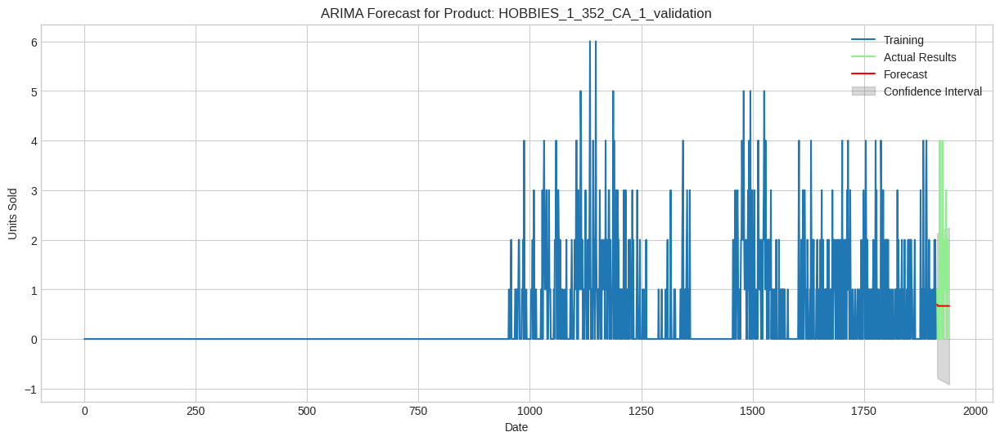

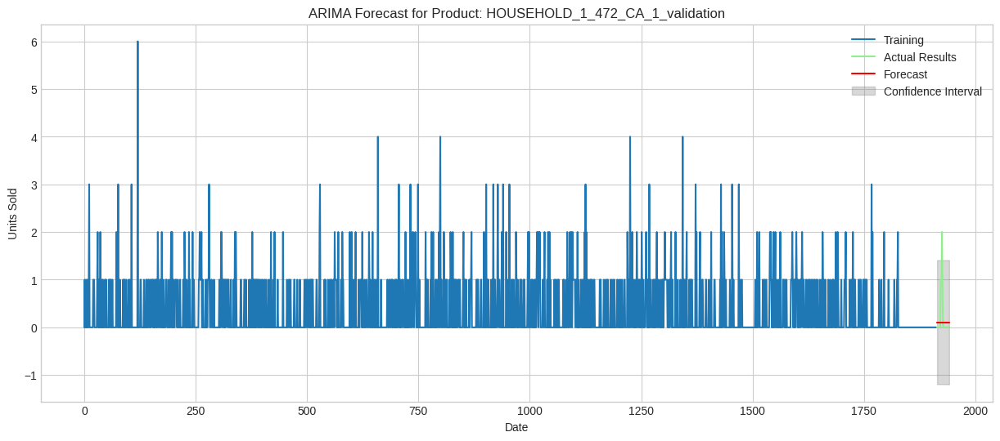

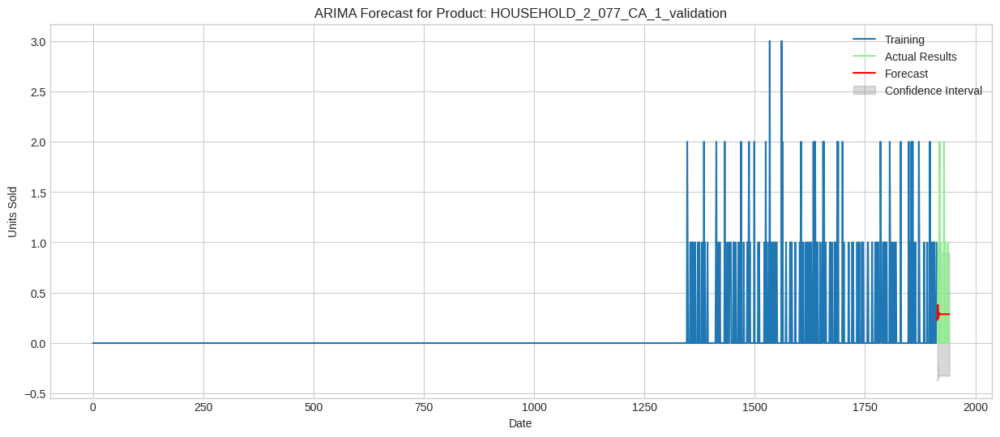

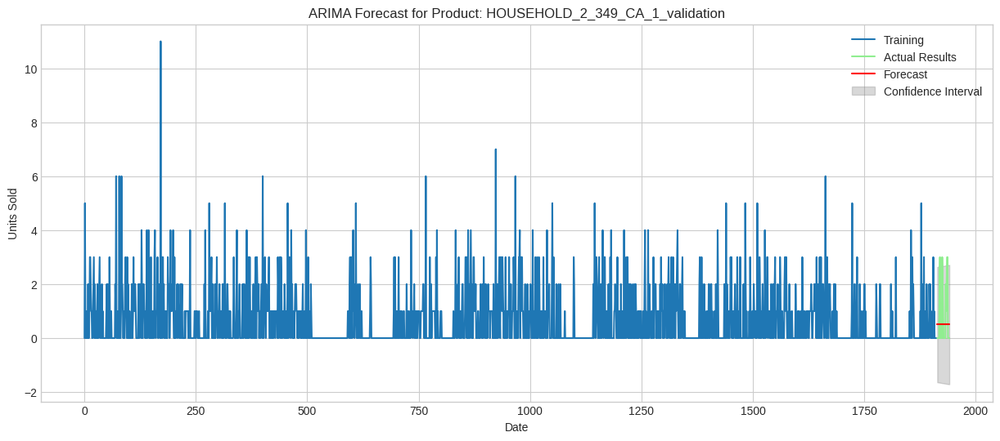

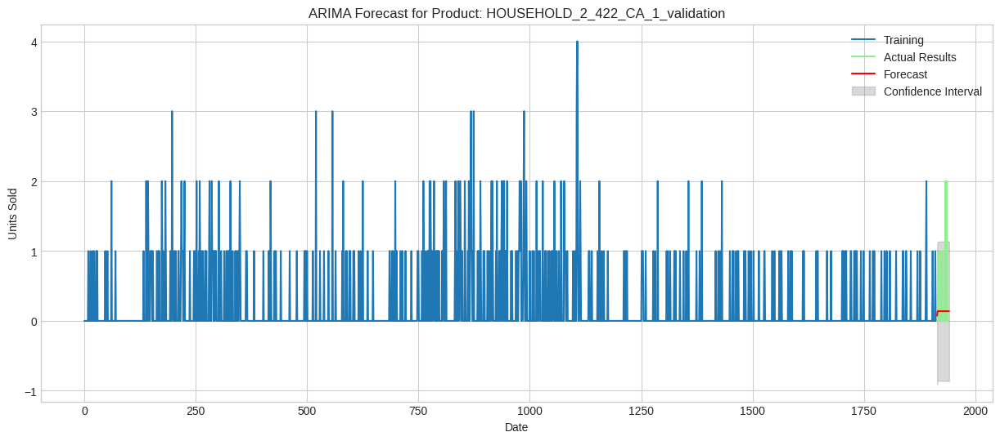

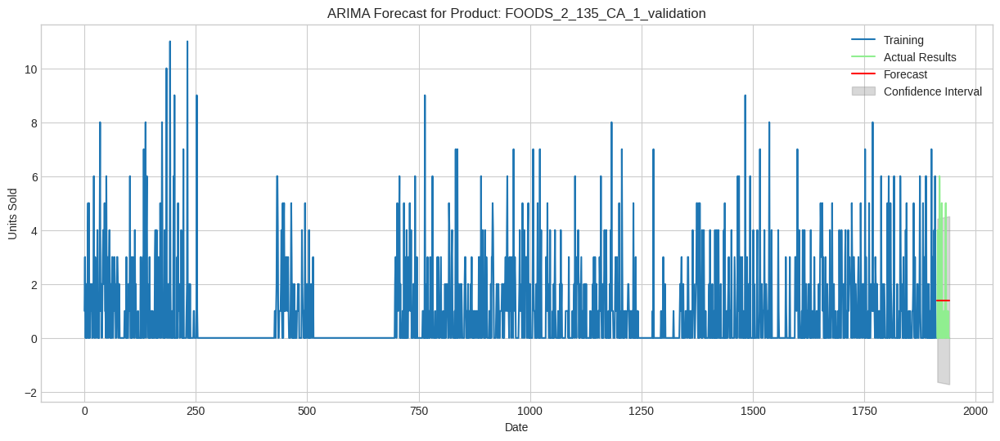

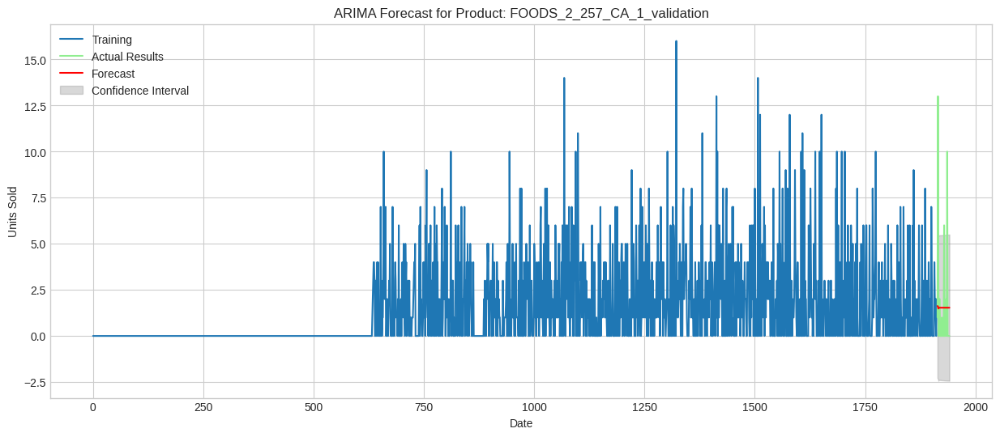

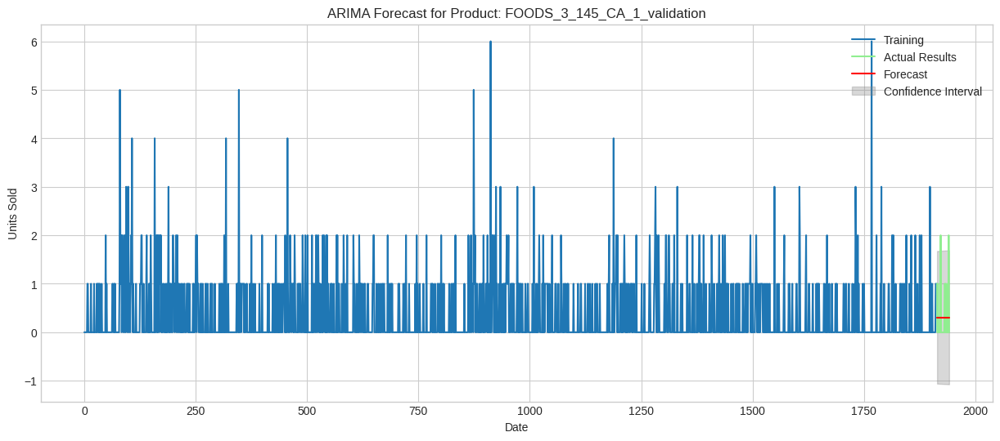

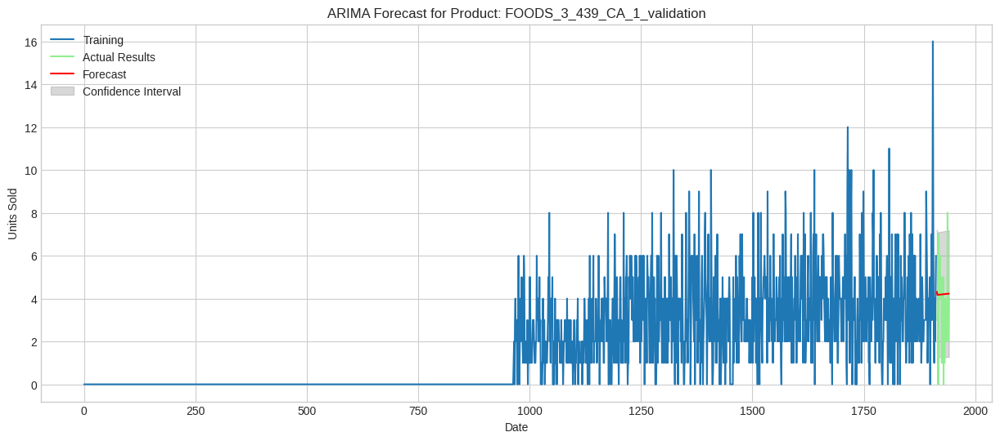

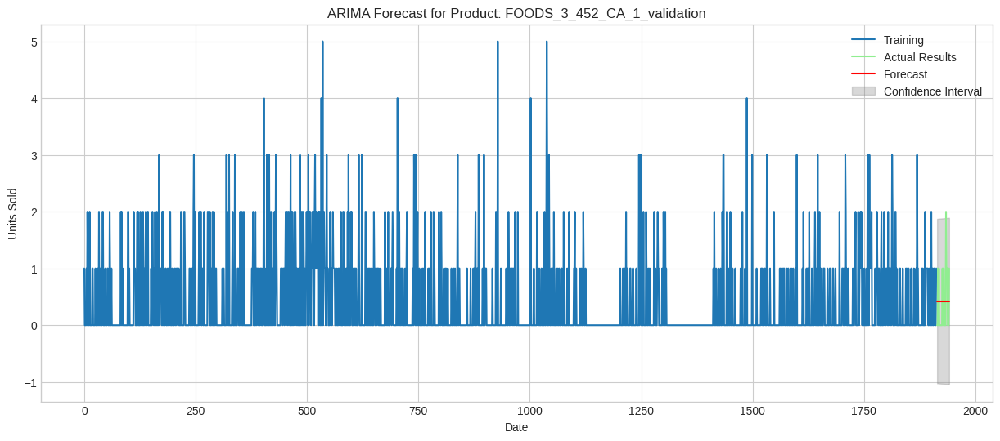

In [ ]:
# @title
n_periods = 28
#Make date index for forecasts
future_dates = list(range(int(salesFull.columns[-1]) + 1, int(salesFull.columns[-1]) + 28 + 1, 1))
print(future_dates)
forecasts = []

for index, row in salesFull.iterrows():
    product_id = index
    current_model = arima_models[product_id]

    # Forecast the next 28 days
    forecast, confInt = current_model.predict(n_periods=n_periods, return_conf_int=True)
    forecasts.append(forecast)
    lower_bound = pd.Series(confInt[:, 0], index=future_dates)
    upper_bound = pd.Series(confInt[:, 1], index=future_dates)
    #Plot the forecasts with their confidence intervals alongside the true values
    actual_sales_series = evaluationForecasts.loc[product_id]
    plt.figure(figsize=(15, 6))
    plt.plot(row.values, label='Training')
    plt.plot(actual_sales_series, label='Actual Results', color = "lightgreen")
    plt.plot(future_dates, forecast, label='Forecast', color = "red")
    plt.fill_between(future_dates, lower_bound, upper_bound, color='gray', alpha=0.3, label='Confidence Interval')
    plt.xlabel('Date')
    plt.ylabel('Units Sold')
    plt.title(f'ARIMA Forecast for Product: {product_id}')
    plt.legend()
    plt.grid(True)
    plt.show()

Challenges

* Non-Stationarity: Some product sales exhibit trends or seasonality, requiring differencing or seasonal adjustments.

* Computational Cost: Fitting ARIMA models for multiple products can be time-consuming, especially with seasonal components.

In almost every case detailed in Figure 2, the forecasts are nearly constant over all 28 days. Due to the sparsity and lack of sufficient variability in our dataset, the models experienced great difficulty in learning the previous trends and autocorrelations in each time series. As a result, each model defaulted to predicting a constant value, usually the mean or mode of the time series.

Over the course of this project, there were a few previous cases in which the model attemped to learn from the data. In these cases, the time series was considerably less sparse and more variable than the other 9 members in its sample. One of these cases is displayed in the figure below.

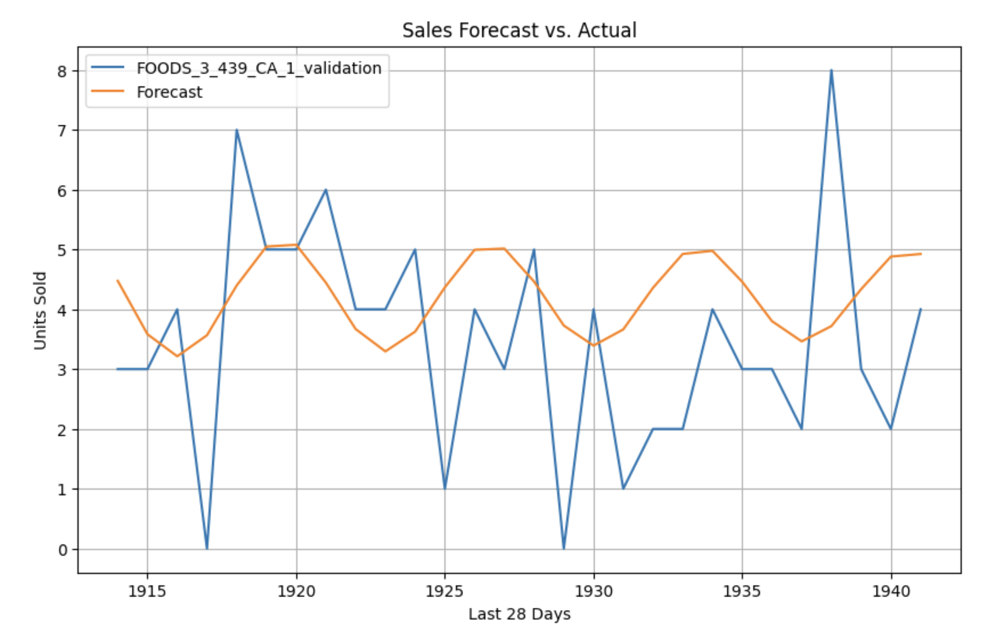

The above figure is a zoomed-in plot of the forecast for the sales of a food item at a Walmart store in California. Here the ARIMA model has learned from some of the variation in the data; the peaks of the sinusoid shape almost correspond with the peaks of the actual sales. This forecast is still far from the kind of forecast we would like to see for this model and is not characteristic of the results we obtained for the other 9 products.

2. Transformer Model(Autoregressive)

The Transformer model, inspired by its success in natural language processing, is adapted for time-series forecasting. We implement a Transformer encoder using Keras, incorporating multi-head attention, layer normalization, and feed-forward layers.

Implementation Steps
* Model Architecture:
  
    * Input Shape: (101,) (101 time steps).
    * Transformer Blocks:

    One encoder block with multi-head attention (10 heads, key dimension 256), layer normalization, dropout and 1D convolutional layers for projection, decoder block.
    * Output: a scaler(prediction for the next day).
* Loss Function: Mean Squared Error (MSE) is used, with Mean Absolute Error (MAE) as an additional metric.
* Callbacks:
    * ReduceLROnPlateau: Reduces the learning rate if validation loss plateaus.
    * EarlyStopping: Stops training if no improvement after 4 epochs.
    * ModelCheckpoint: Saves the best model based on validation loss.

* Training

    We train the model on FOODS_3_439_CA_1_validation as this is the time series in the dataset with least number of zeros). It has a long region of no sale at the beginning, which is not informative for the model. So we removed that region. We trained the model for up to 10 epochs with a batch size of 10, using the callbacks to optimize performance. The training data consists of sequences from the 10 selected products, with validation data reserved for the final 28 days.

In [ ]:
# @title
# Remove
# Exclude the 'id' column and count zeros in each row
zero_counts = (salesFull == 0).sum(axis=1)
# Find the index of the row with the least number of zeros
min_zero_idx = zero_counts.idxmin()
# Get the corresponding time series (row)
least_zeros_series = salesFull.loc[min_zero_idx]
print("ID with least zeros:", min_zero_idx)
print("Number of zeros:", zero_counts[min_zero_idx])
print(least_zeros_series)


ID with least zeros: FOODS_3_439_CA_1_validation
Number of zeros: 1038
1       0
2       0
3       0
4       0
5       0
       ..
1909    1
1910    4
1911    2
1912    4
1913    6
Name: FOODS_3_439_CA_1_validation, Length: 1913, dtype: int64


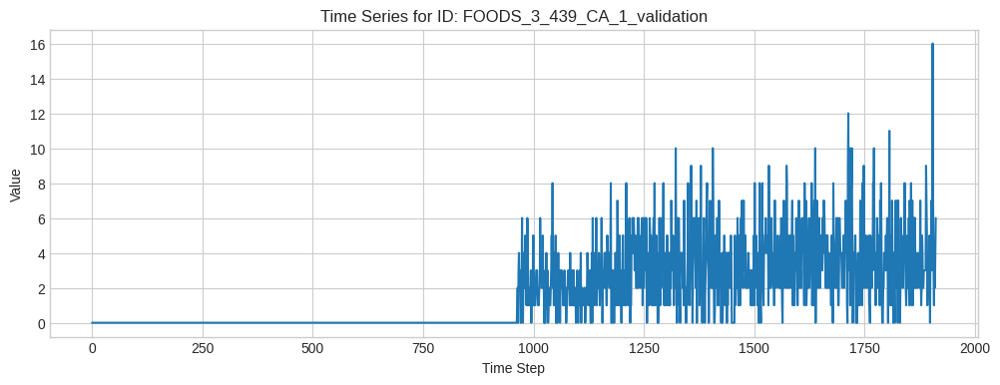

In [ ]:
# @title
# Remove
# Plot the time series values (excluding the 'id' column) for least_zeros_series
plt.figure(figsize=(12, 4))
plt.plot(least_zeros_series[1:].astype(float).values)
plt.title(f"Time Series for ID: {min_zero_idx}")
plt.xlabel("Time Step")
plt.ylabel("Value")
plt.grid(True)
plt.show()

In [ ]:
# @title
# Remove
first_nonzero_index = least_zeros_series[1:].ne(0).idxmax()
print("First nonzero index in least_zeros_series:", first_nonzero_index)
# Drop every column of least_zeros_series before first_nonzero_index (excluding 'id')
cols_to_keep = list(least_zeros_series.index[least_zeros_series.index.get_loc(first_nonzero_index):])
least_zeros_series_clipped = least_zeros_series[cols_to_keep]


First nonzero index in least_zeros_series: 965


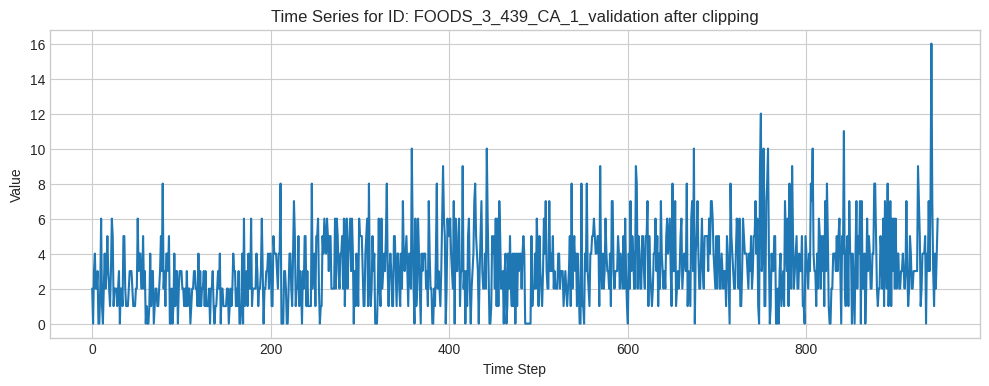

In [ ]:
# @title
# Remove
plt.figure(figsize=(12, 4))
plt.plot(least_zeros_series_clipped[1:].astype(float).values)
plt.xlabel("Time Step")
plt.ylabel("Value")
plt.grid(True)
plt.title(f"Time Series for ID: {min_zero_idx} after clipping")
plt.show()

In [ ]:
# @title
# Remove
def create_inout_sequences(input_data, input_window, output_window):
    """
    Generate input-output sequence pairs from a 1D time series for sequence-to-sequence learning.

    This function is typically used for preparing training data for time series forecasting models
    such as RNNs, LSTMs, GRUs, or Transformers. For each valid position in the input data, it extracts:

    - An input sequence of length `input_window`
    - A target (label) sequence of length `input_window`, starting `output_window` steps ahead

    Parameters
    ----------
    input_data : array-like (e.g., list, np.ndarray, or torch.Tensor)
        A 1D array containing the full time series data from which sequences will be extracted.
    input_window : int
        The number of time steps in each input sequence.
    output_window : int
        The time lag before prediction begins. The output (target) sequence begins after this lag,
        and is of the same length as the input sequence.

    Returns
    -------
    torch.FloatTensor
        A tensor of shape (num_sequences, 2, input_window) where each element is a pair:
        (input_sequence, output_sequence). The output_sequence is taken `output_window` steps
        ahead of the input_sequence.

    Example usage
    -------
    >>> data = np.arange(20)
    >>> sequences = create_inout_sequences(data, input_window=5, output_window=2)
    >>> sequences.shape
    torch.Size([14, 2, 5])
    """
    inout_seq = []
    L = len(input_data)
    block_num =  L - block_len + 1
    # total of [N - block_len + 1] blocks
    # where block_len = input_window + output_window

    for i in range( block_num ):
        train_seq = input_data[i : i + input_window]
        train_label = input_data[i + output_window : i + input_window + output_window]
        inout_seq.append((train_seq ,train_label))

    return torch.FloatTensor(np.array(inout_seq))


In [ ]:
# @title
# Remove
def get_data(data, input_window, standardization=None):
    """
    Prepares training and testing sequences from a 1D time series array.

    Parameters:
    -----------
    data : np.ndarray
        1D NumPy array of time series data.
    input_window : int
        Length of the input sequence for the model.
    standardization : str or None, optional
        Type of scaling to apply to the data.
        Can be 'standard', 'minmax', or None.

    Returns:
    --------
    train_sequence : torch.Tensor
        Training data (input, target) tuples.
    test_data : torch.Tensor
        Testing data (input, target) tuples.
    unique_vals : np.ndarray
        Sorted array of unique scaled values in the dataset.
    weights_tensor : torch.Tensor
        Class weights tensor for CrossEntropyLoss (normalized inverse class frequency).
    """
    from sklearn.preprocessing import MinMaxScaler, StandardScaler

    if standardization == 'standard':
        scaler = StandardScaler()
    elif standardization == 'minmax':
        scaler = MinMaxScaler(feature_range=(-1, 1))
    else:
        scaler = None

    if scaler is not None:
        data = scaler.fit_transform(data.reshape(-1, 1)).reshape(-1)

    unique_vals = np.sort(np.unique(data))

    samples = len(data) - input_window - 1
    train_data = data[:samples]
    test_data = data[samples:]

    train_sequence = create_inout_sequences(train_data, input_window, output_window)
    test_data = create_inout_sequences(test_data, input_window, output_window)

    # Flatten all target labels
    all_targets_tensor = torch.cat([y.view(-1) for _, y in train_sequence], dim=0)
    all_targets_np = all_targets_tensor.cpu().numpy()

    # Count frequencies using a loop over unique_vals
    class_counts = []
    for val in unique_vals:
        count = np.sum(all_targets_np == val)
        class_counts.append(count)

    # Count how often each unique value appears in the (scaled) input data
    class_counts = [np.sum(data == x) for x in unique_vals]
    inverse_freq = 1.0 / np.array(class_counts)
    weights = inverse_freq / inverse_freq.sum()
    weights_tensor = torch.tensor(weights, dtype=torch.float32).to(device)

    print(train_sequence.shape)
    print(test_data.shape)
    print(unique_vals.shape)
    print(weights_tensor.shape)

    return train_sequence.to(device), test_data.to(device), unique_vals, weights_tensor


In [ ]:
# @title
# Remove
def get_batch(input_data, i, batch_size):
    """
    Extracts a batch of input-target sequence pairs from preprocessed data for training.

    This function slices the dataset (typically generated using `create_inout_sequences`)
    and formats it into the shape expected by Transformer models:
    (sequence_length, batch_size, feature_dimension), where the feature dimension is 1
    for univariate time series.

    Parameters
    ----------
    input_data : list of tuples
        The dataset containing (input_sequence, target_sequence) pairs.
        Each pair is assumed to be of shape (input_window,).
    i : int
        Starting index in `input_data` from which to extract the batch.
    batch_size : int
        The number of samples to include in the batch.

    Returns
    -------
    input : torch.Tensor of shape (input_window, batch_len, 1)
        A tensor containing the input sequences for the batch.
    target : torch.Tensor of shape (input_window, batch_len, 1)
        A tensor containing the target sequences for the batch.

    Notes
    -----
    - If there are fewer than `batch_size` samples remaining at the end of the dataset,
      the batch is truncated to avoid index errors.
    - This function assumes that the inputs and targets are already prepared with consistent lengths.

    Example
    -------
    >>> batch_input, batch_target = get_batch(train_data, i=0, batch_size=16)
    >>> batch_input.shape
    torch.Size([input_window, 16, 1])
    """
    batch_len = np.min((batch_size, len(input_data) - i))
    data = input_data[i : i + batch_len]
    input = torch.stack([item[0] for item in data]).view((input_window, batch_len, 1))
    target = torch.stack([item[1] for item in data]).view((input_window, batch_len, 1))
    return input, target


In [ ]:
torch.manual_seed(42)
input_window = 100 # number of input steps
output_window = 1 # number of prediction steps, in this model its fixed to one
block_len = input_window + output_window # for one input-output pair
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
data = least_zeros_series_clipped.to_numpy()
data = np.array(data)
block_len = input_window + output_window
train_data, val_data, unique_vals, weights_tensor = get_data(data, input_window=input_window, standardization='standard')


torch.Size([748, 2, 100])
torch.Size([1, 2, 100])
(14,)
torch.Size([14])


In [ ]:
class PositionalEncoding(nn.Module):
    """
    Implements sinusoidal positional encoding for time-step information in sequence modeling.

    Args:
        d_model (int): Dimensionality of the embeddings.
        dropout (float): Dropout rate applied after adding positional encodings.
        max_len (int): Maximum sequence length for which encoding is computed.
    """
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)  # shape: (max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)  # (max_len, 1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))

        pe[:, 0::2] = torch.sin(position * div_term)  # even indices
        pe[:, 1::2] = torch.cos(position * div_term)  # odd indices

        pe = pe.unsqueeze(1)  # shape: (max_len, 1, d_model)
        self.register_buffer('pe', pe)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Adds positional encoding to the input embeddings.

        Args:
            x (Tensor): Input tensor of shape (seq_len, batch_size, d_model).

        Returns:
            Tensor: Positionally encoded input of the same shape as input.
        """
        x = x + self.pe[:x.size(0)]
        return self.dropout(x)


In [ ]:
# @title
class TransAm(nn.Module):
    """
    Transformer-based model for time series regression or sequence prediction.

    Architecture:
        - Input projection: Maps 1D input to `feature_size` dimensional embedding.
        - Positional encoding: Adds time-step information to embeddings.
        - Transformer encoder: Captures temporal dependencies.
        - Layer normalization: Stabilizes training.
        - Decoder (MLP): Maps encoded features to scalar predictions.

    Args:
        feature_size (int): Dimensionality of the embedding/hidden layers.
        num_layers (int): Number of transformer encoder layers.
        dropout (float): Dropout rate for regularization.
    """
    def __init__(self, feature_size=250, num_layers=2, dropout=0.1):
        super(TransAm, self).__init__()
        self.model_type = 'Transformer'
        self.feature_size = feature_size

        # Learnable input projection from scalar to feature_size
        self.input_projection = nn.Linear(1, feature_size)

        # Positional Encoding
        self.pos_encoder = PositionalEncoding(feature_size, dropout)

        # Transformer Encoder Stack
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=feature_size,
            nhead=10,
            dropout=dropout,
            batch_first=False
        )
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # Layer normalization
        self.norm = nn.LayerNorm(feature_size)

        # MLP decoder
        self.decoder = nn.Sequential(
            nn.Linear(feature_size, feature_size // 2),
            nn.ReLU(),
            nn.Linear(feature_size // 2, 1)
        )

        self.init_weights()

    def init_weights(self):
        """
        Initializes weights of all linear layers uniformly in [-0.1, 0.1].
        """
        initrange = 0.1
        for m in self.modules():
            if isinstance(m, nn.Linear):
                m.weight.data.uniform_(-initrange, initrange)
                m.bias.data.zero_()

    def forward(self, src: torch.Tensor) -> torch.Tensor:
        """
        Forward pass of the TransAm model.

        Args:
            src (Tensor): Input tensor of shape (seq_len, batch_size, 1), representing a sequence
                          of scalar time series values.

        Returns:
            Tensor: Output tensor of shape (seq_len, batch_size, 1), representing the predicted values.
        """
        src = self.input_projection(src)        # Shape: (seq_len, batch_size, feature_size)
        src = self.pos_encoder(src)
        output = self.transformer_encoder(src)
        output = self.norm(output)
        output = self.decoder(output)           # Shape: (seq_len, batch_size, 1)
        return output


In [ ]:
# @title
def train(train_data, scheduler_ = False):
    """
    Runs one epoch of training for the Transformer model on the given time series dataset.

    This function processes the training data in mini-batches, computes predictions,
    evaluates the loss, performs backpropagation, and updates model weights. It also
    applies gradient clipping to ensure training stability and logs key training metrics.

    Parameters
    ----------
    train_data : list of tuples
        A list of (input_sequence, target_sequence) pairs, typically created using
        `create_inout_sequences`.

    Assumes the following global variables are defined:
    -----------------------------------------------
    model : nn.Module
        The Transformer model to be trained.
    optimizer : torch.optim.Optimizer
        The optimizer used for parameter updates.
    criterion : callable
        The loss function used to compute error between output and target (e.g., nn.MSELoss()).
    batch_size : int
        Number of samples in each mini-batch.
    input_window : int
        Length of input sequence for each sample (used in `get_batch`).
    epoch : int
        Current epoch number (used in logging output).
    scheduler : torch.optim.lr_scheduler
        Learning rate scheduler with `get_lr()` method.
    time : module
        Python's `time` module (for timing).
    math : module
        Python's `math` module (for computing perplexity via `math.exp()`).

    Prints
    ------
    Training statistics every ~20% of the epoch:
    - Current epoch and batch index
    - Learning rate
    - Elapsed time per logging interval (ms)
    - Average loss
    - Perplexity (exp of average loss)

    Returns
    -------
    float
        The average loss for the epoch.
    """
    model.train() # Turn on the train mode \o/
    total_loss = 0.
    start_time = time.time()
    losses = []
    for batch, i in enumerate(range(0, len(train_data), batch_size)):
        data, targets = get_batch(train_data, i , batch_size)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, targets)
        loss.backward()
        # torch.nn.utils.clip_grad_norm_(model.parameters(), 0.7)
        optimizer.step()
        if scheduler_:
          scheduler.step()
        total_loss += loss.item()

        log_interval = int(len(train_data) / batch_size / 5)
        if batch % log_interval == 0 and batch > 0:
            losses.append(total_loss / log_interval)
            cur_loss = total_loss / log_interval
            elapsed = time.time() - start_time
            print('| epoch {:3d} | {:5d}/{:5d} batches | '
                  'lr {:02.6f} | {:5.2f} ms | '
                  'loss {:5.5f} | ppl {:8.2f}'.format(
                    epoch, batch, len(train_data) // batch_size, scheduler.get_lr()[0],
                    elapsed * 1000 / log_interval,
                    cur_loss, math.exp(cur_loss)))
            total_loss = 0
            start_time = time.time()

    return np.mean(losses)


In [ ]:
# @title
# Remove
def plot_and_loss(eval_model, data_source,epoch):
    eval_model.eval()
    total_loss = 0.
    test_result = torch.Tensor(0)
    truth = torch.Tensor(0)
    with torch.no_grad():
        for i in range(len(data_source)):  # Now len-1 is not necessary
            data, target = get_batch(data_source, i , 1) # one-step forecast
            output = eval_model(data)
            total_loss += criterion(output, target).item()
            test_result = torch.cat((test_result, output[-1].view(-1).cpu()), 0)
            truth = torch.cat((truth, target[-1].view(-1).cpu()), 0)

    #test_result = test_result.cpu().numpy() -> no need to detach stuff..
    len(test_result)

    return total_loss / data_source.shape[0]


In [ ]:
# @title
# Remove
def predict_future(eval_model, data_source, true_data, steps):
    eval_model.eval()

    data, _ = get_batch(data_source , 0 , 1)
    true_data, _ = get_batch(true_data , 0 , 1)
    with torch.no_grad():
        for i in range(0, steps):
            output = eval_model(data[-input_window:])
            data = torch.cat((data, output[-1:])) # [m,m+1,..., m+n+1]

    data = data.cpu().view(-1)
    true_data = true_data.cpu().view(-1)
    data = data.cpu().view(-1)
    plt.figure(figsize=(16, 6))
    plt.plot(range(1914-input_window-steps,1914),data,color="blue", label = 'Forecast')
    plt.plot(range(1914-input_window-steps, 1914-steps),data[:input_window],color="red", label = 'Training data')
    plt.plot(range(1914-steps,1914),true_data[-steps:],color="green", label = 'True data')
    plt.grid(True, which='both')
    plt.xlabel("Day")
    plt.ylabel("Units sold(standardized)")
    plt.title("Sales forecast")
    plt.legend()
    plt.show()
    plt.close()


In [ ]:
# @title
# Remove
def evaluate(eval_model, data_source):
    eval_model.eval() # Turn on the evaluation mode
    total_loss = 0.
    eval_batch_size = 1
    with torch.no_grad():
        # for i in range(0, len(data_source) - 1, eval_batch_size): # Now len-1 is not necessary
        for i in range(0, len(data_source), eval_batch_size):
            data, targets = get_batch(data_source, i,eval_batch_size)
            output = eval_model(data)
            total_loss += len(data[0]) * criterion(output, targets).cpu().item()
    return total_loss / len(data_source)

In [ ]:
model = TransAm(feature_size=500, num_layers=2, dropout=0.1).to(device)

In [ ]:
criterion = nn.MSELoss()
lr = 0.0001
#optimizer = torch.optim.SGD(model.parameters(), lr=lr)
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 1, gamma=0.95)

In [ ]:
# @title
# Remove
extracted_part = train_data[-len(val_data):]
extracted_batch, extracted_target = get_batch(extracted_part, 0, 1)

| epoch   1 |     2/   11 batches | lr 0.000100 | 9504.27 ms | loss 4.38281 | ppl    80.06
| epoch   1 |     4/   11 batches | lr 0.000100 | 5653.67 ms | loss 1.87349 | ppl     6.51
| epoch   1 |     6/   11 batches | lr 0.000100 | 5759.60 ms | loss 2.21844 | ppl     9.19
| epoch   1 |     8/   11 batches | lr 0.000100 | 5751.40 ms | loss 1.08595 | ppl     2.96
| epoch   1 |    10/   11 batches | lr 0.000100 | 5307.13 ms | loss 1.89099 | ppl     6.63
-----------------------------------------------------------------------------------------
| end of epoch   1 | time: 68.12s | valid loss 1.5881 | valid ppl     4.89
-----------------------------------------------------------------------------------------
| epoch   2 |     2/   11 batches | lr 0.000100 | 8374.68 ms | loss 1.12634 | ppl     3.08
| epoch   2 |     4/   11 batches | lr 0.000100 | 5809.66 ms | loss 0.94853 | ppl     2.58
| epoch   2 |     6/   11 batches | lr 0.000100 | 5920.07 ms | loss 1.12810 | ppl     3.09
| epoch   2 |    

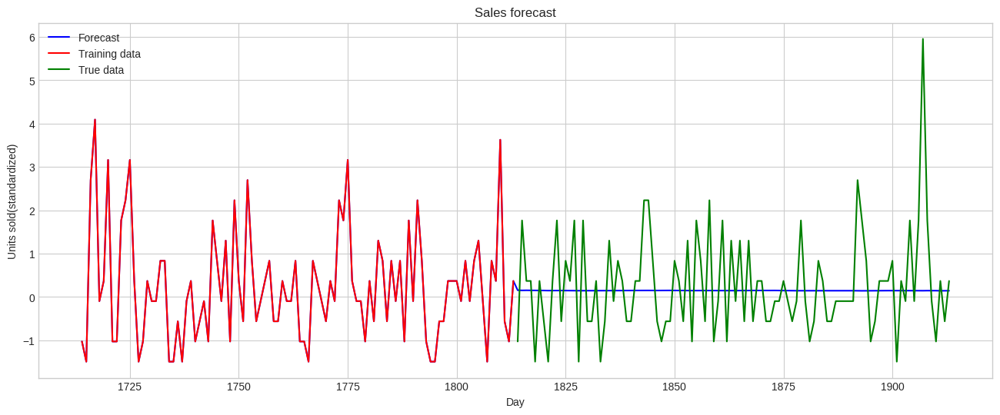

-----------------------------------------------------------------------------------------
| end of epoch   5 | time: 68.58s | valid loss 1.2898 | valid ppl     3.63
-----------------------------------------------------------------------------------------
| epoch   6 |     2/   11 batches | lr 0.000100 | 8356.94 ms | loss 1.26389 | ppl     3.54
| epoch   6 |     4/   11 batches | lr 0.000100 | 5958.42 ms | loss 0.93431 | ppl     2.55
| epoch   6 |     6/   11 batches | lr 0.000100 | 7102.59 ms | loss 1.12698 | ppl     3.09
| epoch   6 |     8/   11 batches | lr 0.000100 | 5823.32 ms | loss 0.92454 | ppl     2.52
| epoch   6 |    10/   11 batches | lr 0.000100 | 5274.64 ms | loss 1.15892 | ppl     3.19
-----------------------------------------------------------------------------------------
| end of epoch   6 | time: 69.46s | valid loss 1.2789 | valid ppl     3.59
-----------------------------------------------------------------------------------------
| epoch   7 |     2/   11 batches |

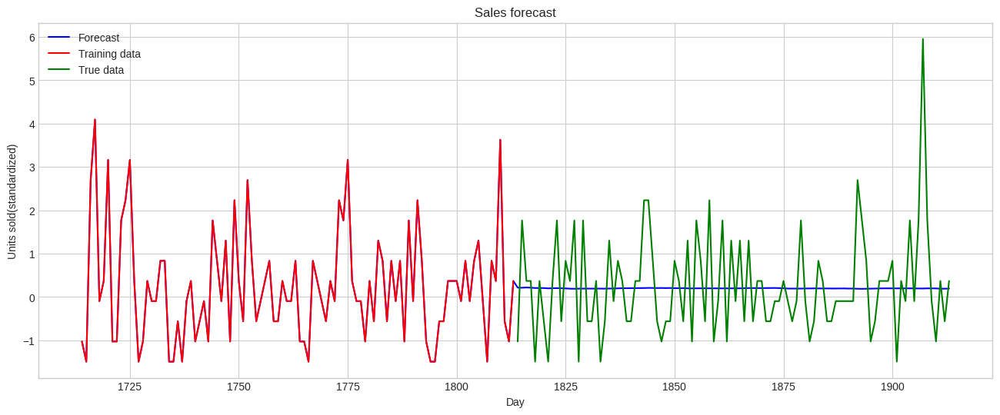

-----------------------------------------------------------------------------------------
| end of epoch  10 | time: 70.71s | valid loss 1.2857 | valid ppl     3.62
-----------------------------------------------------------------------------------------


In [ ]:
best_val_loss = float("inf")
batch_size = 64
epochs = 10 # The number of epochs
best_model = None
train_loss_list = []
val_loss_list = []

for epoch in range(1, epochs + 1):
    epoch_start_time = time.time()
    train_loss = train(train_data)
    train_loss_list.append(train_loss)

    if ( epoch % 5 == 0 ):
        val_loss = plot_and_loss(model, val_data,epoch)
        predict_future(model, extracted_part, val_data,input_window)
    # else:
    val_loss = evaluate(model, val_data)
    val_loss_list.append(val_loss)

    print('-' * 89)
    print('| end of epoch {:3d} | time: {:5.2f}s | valid loss {:5.4f} | valid ppl {:8.2f}'.format(epoch, (time.time() - epoch_start_time),
                                     val_loss, math.exp(val_loss)))
    print('-' * 89)

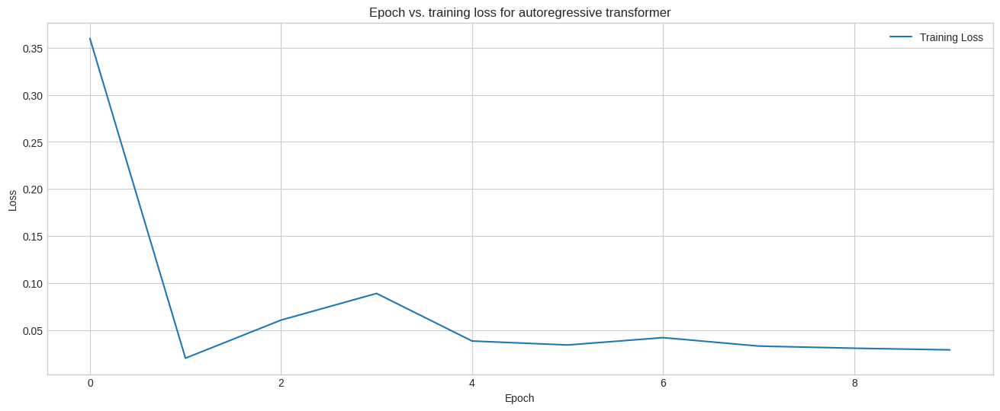

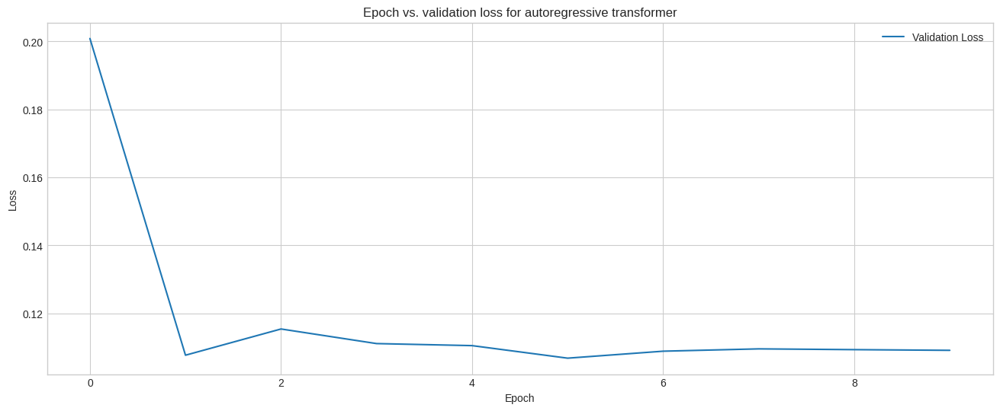

In [ ]:
# @title
# Remove
plt.figure(figsize=(16, 6))
plt.plot(np.log10(train_loss_list), label='Training Loss')
# plt.plot(np.arange(10), val_loss_list, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs. training loss for autoregressive transformer')
plt.legend()
plt.show()

plt.figure(figsize=(16, 6))
# plt.plot(np.arange(10), train_loss_list, label='Training Loss')
plt.plot(np.log10(val_loss_list), label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs. validation loss for autoregressive transformer')
plt.legend()
plt.show()

3. Transformer Model(Classifier)

The poor performance of the autoregressive transformer model warranted some further exploration for possible improvement. Inspired by the fact that there are only a few unique values in each time series, we reinterpreted the problem to a classification problem from a regression problem and modify the model accordingly, with the expectation the limit the possible outcomes of the model only to the unique values would increase the accuracy.

Implementation Steps
* Model Architecture:
  
    * Input Shape: (101,) (101 time steps).
    * Transformer Blocks:

    One encoder block with multi-head attention (10 heads, key dimension 256), layer normalization, dropout and 1D convolutional layers for projection, decoder block.
    * Output: a 12 dimensional vector as there are 12 unique elements in the series. Each entry of the output vector represents the probability of the forecast for 101st day in the corresponding class.
* Loss Function: Multi-class cross-entropy.
* Callbacks:
    * ReduceLROnPlateau: Reduces the learning rate if validation loss plateaus.
    * EarlyStopping: Stops training if no improvement after 4 epochs.
    * ModelCheckpoint: Saves the best model based on validation loss.

* Training

    We train this model on the same dataset with exact same specifications as the autoregressive model.

In [ ]:
class TransAmClassifier(nn.Module):
    """
    TransAmClassifier: A Transformer-based model for univariate time series classification.

    This model processes a sequence of scalar values and outputs a sequence of class logits
    (for each time step) over a fixed set of discrete values.

    Architecture:
    -------------
    - Scalar inputs are linearly projected to a high-dimensional embedding space.
    - Sinusoidal positional encoding adds temporal structure.
    - Transformer encoder layers apply self-attention across the sequence.
    - A linear decoder maps each encoded position to class logits.

    Parameters
    ----------
    feature_size : int
        Dimensionality of the embedding space and the Transformer model.
    num_classes : int
        Number of distinct class labels in the output.
    num_layers : int, default=1
        Number of TransformerEncoderLayers in the encoder stack.
    dropout : float, default=0.1
        Dropout rate applied in the encoder layers.

    Input
    -----
    src : torch.Tensor of shape (input_window, batch_size, 1)
        A batch of input sequences with scalar values per timestep.

    Output
    ------
    torch.Tensor of shape (input_window, batch_size, num_classes)
        The class logits for each timestep in the input window.
    """

    def __init__(self, feature_size, num_classes, num_layers=1, dropout=0.1):
        super(TransAmClassifier, self).__init__()
        self.model_type = 'Transformer'
        self.input_embedding = nn.Linear(1, feature_size)
        self.src_mask = None

        self.pos_encoder = PositionalEncoding(feature_size)
        self.encoder_layer = nn.TransformerEncoderLayer(d_model=feature_size, nhead=10, dropout=dropout)
        self.transformer_encoder = nn.TransformerEncoder(self.encoder_layer, num_layers=num_layers)
        self.decoder = nn.Linear(feature_size, num_classes)
        self.init_weights()

    def init_weights(self):
        initrange = 0.1
        self.decoder.bias.data.zero_()
        self.decoder.weight.data.uniform_(-initrange, initrange)

    def forward(self, src):
        # src: (input_window, batch_size, 1)
        if self.src_mask is None or self.src_mask.size(0) != len(src):
            device = src.device
            self.src_mask = self._generate_square_subsequent_mask(len(src)).to(device)

        src = self.input_embedding(src)           # (input_window, batch_size, feature_size)
        src = self.pos_encoder(src)               # add positional encoding
        output = self.transformer_encoder(src, self.src_mask)  # (input_window, batch_size, feature_size)
        output = self.decoder(output)             # (input_window, batch_size, num_classes)
        return output

    def _generate_square_subsequent_mask(self, sz):
        mask = (torch.triu(torch.ones(sz, sz)) == 1).transpose(0, 1)
        mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
        return mask


In [ ]:
def TrainClassifier(train_data, scheduler_=False):
    """
    Runs one epoch of training for the classification version of the Transformer model.

    For each batch:
    - Feeds input through the model to get class logits for each timestep.
    - Reshapes outputs and targets appropriately for CrossEntropyLoss.
    - Computes loss, backpropagates, and updates model parameters.
    - Logs loss and training statistics periodically.

    Parameters
    ----------
    train_data : list of tuples
        A list of (input_sequence, target_sequence) pairs, typically created using
        `create_inout_sequences`, where targets are integer class labels.

    Assumes the following global variables are defined:
    -----------------------------------------------
    model : nn.Module
        The Transformer classification model to be trained.
    optimizer : torch.optim.Optimizer
        The optimizer used for parameter updates.
    criterion : callable
        The loss function (should be nn.CrossEntropyLoss()).
    batch_size : int
        Number of samples in each mini-batch.
    input_window : int
        Length of input sequence for each sample (used in `get_batch`).
    epoch : int
        Current epoch number (used in logging output).
    scheduler : torch.optim.lr_scheduler
        Learning rate scheduler with `get_lr()` method.
    time : module
        Python's `time` module (for timing).
    math : module
        Python's `math` module (for computing perplexity via `math.exp()`).

    Returns
    -------
    float
        The average loss for the epoch.
    """
    model_classifier.train()
    total_loss = 0.
    start_time = time.time()
    losses = []

    for batch, i in enumerate(range(0, len(train_data), batch_size)):
        data, targets = get_batch(train_data, i, batch_size)
        output = model_classifier(data)
        output = output.view(-1, output.size(-1))
        # Map target values to 0..num_classes-1
        targets_flat = targets.view(-1)                   # flatten targets
        for idx, val in enumerate(unique_vals):           # ✅ FIX: encode labels
            targets_flat[targets_flat == val] = idx
        targets_idx = targets_flat.long()
        loss = criterion(output, targets_idx)             # compute loss with mapped targets
        loss.backward()
        optimizer.step()
        if scheduler_:
          scheduler.step()
        total_loss += loss.item()

        log_interval = int(len(train_data) / batch_size / 5)
        if batch % log_interval == 0 and batch > 0:
            losses.append(total_loss / log_interval)
            cur_loss = total_loss / log_interval
            elapsed = time.time() - start_time
            print('| epoch {:3d} | {:5d}/{:5d} batches | '
                  'lr {:02.6f} | {:5.2f} ms | '
                  'loss {:5.5f} | ppl {:8.2f}'.format(
                    epoch, batch, len(train_data) // batch_size, scheduler.get_lr()[0],
                    elapsed * 1000 / log_interval,
                    cur_loss, math.exp(cur_loss)))
            total_loss = 0
            start_time = time.time()

    return np.mean(losses)


In [ ]:
# @title
def plot_and_loss_classifier(eval_model, data_source, epoch):
    """
    Evaluates the classification model on a given dataset and computes average loss.

    For each sample in the data source:
    - Performs forward pass to get class logits for each time step.
    - Computes classification loss using CrossEntropyLoss.
    - Stores predicted class labels and true labels for final step visualization.

    Parameters
    ----------
    eval_model : nn.Module
        The trained classification model to evaluate.
    data_source : list of tuples
        List of (input_sequence, target_sequence) pairs.
    epoch : int
        The current epoch number (used for logging, if needed).

    Assumes the following global variables are defined:
    -----------------------------------------------
    criterion : callable
        The loss function (nn.CrossEntropyLoss).

    Returns
    -------
    float
        The average loss over the evaluation set.
    """
    eval_model.eval()
    total_loss = 0.
    test_result = torch.Tensor(0)
    truth = torch.Tensor(0)

    with torch.no_grad():
        for i in range(len(data_source)):
            data, targets = get_batch(val_data, i, batch_size=1)
            output = model_classifier(data)
            output = output.view(-1, output.size(-1))
            targets_flat = targets.view(-1)
            for idx, val in enumerate(unique_vals):           # ✅ ensure validation labels are encoded
                targets_flat[targets_flat == val] = idx
            targets_idx = targets_flat.long()
            total_loss += criterion(output, targets_idx).item()

            pred_classes = output.argmax(dim=-1).cpu()   # (input_window,)
            test_result = torch.cat((test_result, pred_classes), 0)
            truth = torch.cat((truth, targets.cpu()), 0)

    return total_loss / len(data_source)


In [ ]:
# @title
def evaluate_classifier(eval_model, data_source):
    """
    Evaluates the classification Transformer model on a given dataset and returns the average loss.

    Parameters
    ----------
    eval_model : nn.Module
        The trained classification model.
    data_source : list of tuples
        List of (input_sequence, target_sequence) pairs.

    Assumes the following global variables are defined:
    -----------------------------------------------
    criterion : callable
        The loss function (nn.CrossEntropyLoss).

    Returns
    -------
    float
        The average classification loss over the evaluation dataset.
    """
    eval_model.eval()
    total_loss = 0.
    eval_batch_size = 1

    with torch.no_grad():
        for i in range(0, len(data_source), eval_batch_size):
            data, targets = get_batch(val_data, i, batch_size=1)
            output = model_classifier(data)
            output = output.view(-1, output.size(-1))
            targets_flat = targets.view(-1)
            for idx, val in enumerate(unique_vals):           # ✅ ensure validation labels are encoded
                targets_flat[targets_flat == val] = idx
            targets_idx = targets_flat.long()
            total_loss += criterion(output, targets_idx).item()

    return total_loss / len(data_source)


In [ ]:
# @title
def predict_future_classifier(eval_model, data_source, true_data, steps, unique_vals):
    """
    Predicts future values using the classification Transformer model in an autoregressive manner
    and plots the forecasted sequence against the true future values.

    Parameters
    ----------
    eval_model : nn.Module
        The trained classification model.
    data_source : list of tuples
        Initial data for generating the forecast. Only the first sequence is used.
    true_data : list of tuples
        The ground truth future data. Only the first sequence is used.
    steps : int
        Number of future time steps to predict.
    unique_vals : np.ndarray
        Array of unique values in the time series (used to decode predicted class index).

    Returns
    -------
    None
        Displays a plot comparing predicted and true values.
    """
    eval_model.eval()

    data, _ = get_batch(data_source, 0, 1)      # (input_window, 1, 1)
    true_data, _ = get_batch(true_data, 0, 1)   # (input_window, 1)

    with torch.no_grad():
        for i in range(steps):
            output = eval_model(data[-input_window:])  # (input_window, 1, num_classes)
            logits = output[-1]                        # (1, num_classes)
            pred_class = torch.argmax(logits, dim=-1)  # () scalar tensor
            pred_value = torch.tensor([[unique_vals[pred_class.item()]]], device=data.device, dtype=torch.float32)  # (1,1)

            # Append predicted value to sequence
            data = torch.cat((data, pred_value.unsqueeze(0)), dim=0)  # shape: (input_window + i + 1, 1, 1)

    data = data.cpu().view(-1)         # (input_window + steps,)
    true_data = true_data.cpu().view(-1)

    plt.figure(figsize=(16, 6))
    plt.plot(range(1914 - input_window - steps, 1914), data, color="blue", label='Forecast')
    plt.plot(range(1914 - input_window - steps, 1914 - steps), data[:input_window], color="red", label='Training data')
    plt.plot(range(1914 - steps, 1914), unique_vals[true_data[-steps:].long()], color="green", label='True data')
    plt.grid(True, which='both')
    plt.xlabel("Day")
    plt.ylabel("Units sold(standardized)")
    plt.title("Sales forecast")
    plt.legend()
    plt.show()
    plt.close()


In [ ]:
num_classes = len(unique_vals)  # must be defined earlier
feature_size = 500              # or any value you want

model_classifier = TransAmClassifier(feature_size=feature_size, num_layers=2, num_classes=num_classes).to(device)



In [ ]:
criterion = nn.CrossEntropyLoss()
lr = 0.0001
optimizer = torch.optim.AdamW(model_classifier.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.95)

| epoch   1 |     2/   11 batches | lr 0.000100 | 8797.09 ms | loss 4.12261 | ppl    61.72
| epoch   1 |     4/   11 batches | lr 0.000100 | 5375.74 ms | loss 3.64090 | ppl    38.13
| epoch   1 |     6/   11 batches | lr 0.000100 | 5770.77 ms | loss 3.52109 | ppl    33.82
| epoch   1 |     8/   11 batches | lr 0.000100 | 5836.05 ms | loss 4.33421 | ppl    76.26
| epoch   1 |    10/   11 batches | lr 0.000100 | 5883.39 ms | loss 4.17938 | ppl    65.33
>>> Best model updated and saved (epoch 1)
-----------------------------------------------------------------------------------------
| end of epoch   1 | time: 66.61s | valid loss 4.6767 | valid ppl   107.41
-----------------------------------------------------------------------------------------
| epoch   2 |     2/   11 batches | lr 0.000100 | 8325.87 ms | loss 5.15227 | ppl   172.82
| epoch   2 |     4/   11 batches | lr 0.000100 | 5785.65 ms | loss 4.49693 | ppl    89.74
| epoch   2 |     6/   11 batches | lr 0.000100 | 5882.20 ms | lo

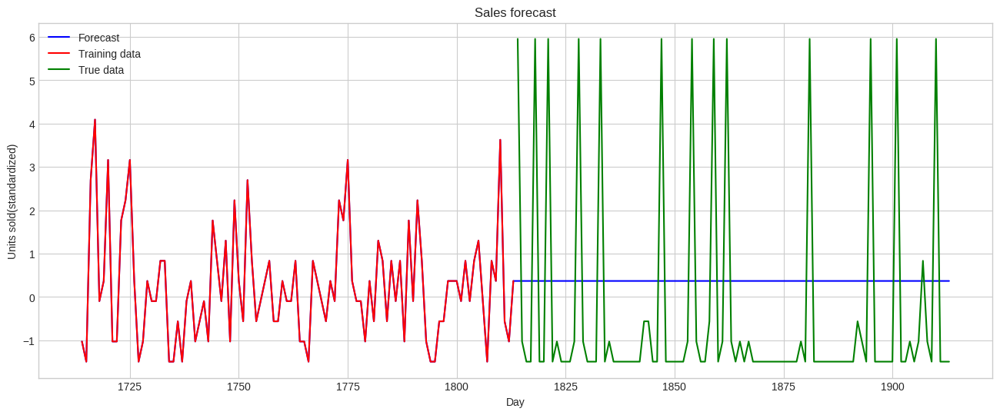

-----------------------------------------------------------------------------------------
| end of epoch   5 | time: 72.73s | valid loss 4.2444 | valid ppl    69.72
-----------------------------------------------------------------------------------------
| epoch   6 |     2/   11 batches | lr 0.000100 | 9297.82 ms | loss 6.73691 | ppl   842.95
| epoch   6 |     4/   11 batches | lr 0.000100 | 5151.27 ms | loss 4.09504 | ppl    60.04
| epoch   6 |     6/   11 batches | lr 0.000100 | 5790.56 ms | loss 4.25076 | ppl    70.16
| epoch   6 |     8/   11 batches | lr 0.000100 | 5812.74 ms | loss 4.57269 | ppl    96.80
| epoch   6 |    10/   11 batches | lr 0.000100 | 5856.42 ms | loss 4.65559 | ppl   105.17
-----------------------------------------------------------------------------------------
| end of epoch   6 | time: 67.13s | valid loss 5.1769 | valid ppl   177.14
-----------------------------------------------------------------------------------------
| epoch   7 |     2/   11 batches |

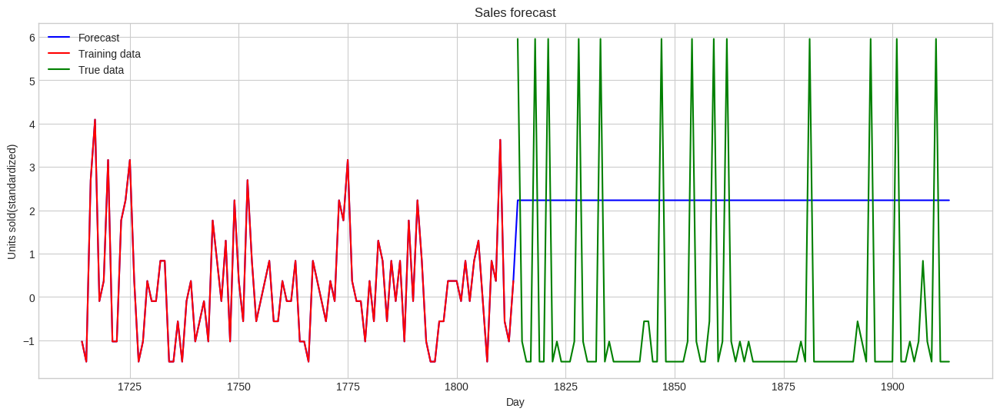

>>> Best model updated and saved (epoch 10)
-----------------------------------------------------------------------------------------
| end of epoch  10 | time: 85.61s | valid loss 4.0473 | valid ppl    57.24
-----------------------------------------------------------------------------------------


In [ ]:
# @title
best_val_loss = float("inf")
batch_size = 64
epochs = 10  # Number of epochs
best_model = None
train_loss_list = []
val_loss_list = []

for epoch in range(1, epochs + 1):
    epoch_start_time = time.time()

    train_loss = TrainClassifier(train_data)
    train_loss_list.append(train_loss)

    if (epoch % 5 == 0):
        val_loss = plot_and_loss_classifier(model_classifier, val_data, epoch)
        predict_future_classifier(model_classifier, extracted_part, val_data, input_window, unique_vals)
    else:
        val_loss = evaluate_classifier(model_classifier, val_data)
    val_loss_list.append(val_loss)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        # torch.save(model_classifier.state_dict(), '/content/model/best_model_classifier')
        print(f">>> Best model updated and saved (epoch {epoch})")

    print('-' * 89)
    print('| end of epoch {:3d} | time: {:5.2f}s | valid loss {:5.4f} | valid ppl {:8.2f}'.format(
        epoch, (time.time() - epoch_start_time),
        val_loss, math.exp(val_loss)))
    print('-' * 89)


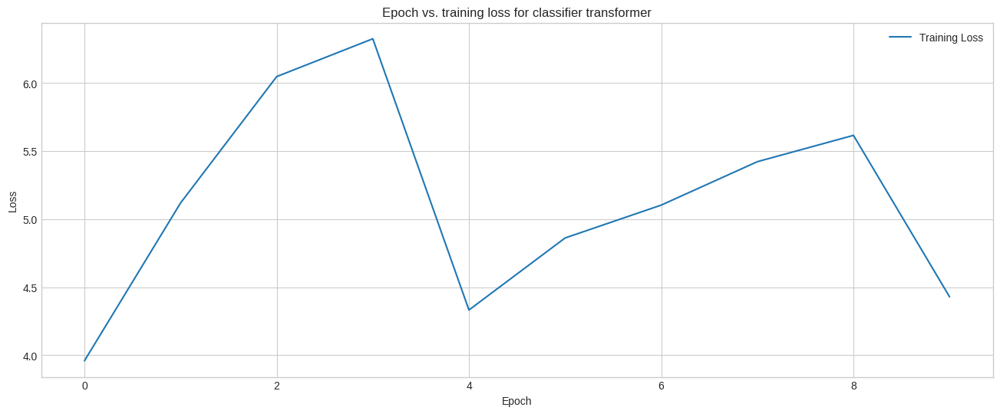

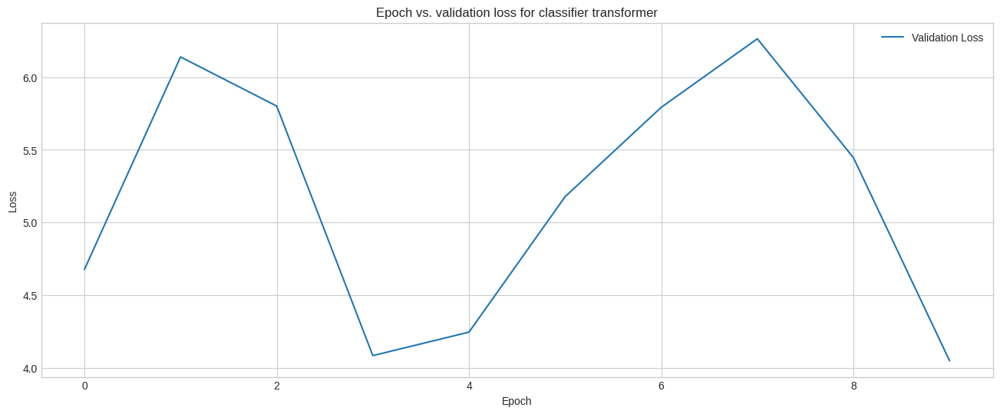

In [ ]:
# @title
plt.figure(figsize=(16, 6))
plt.plot(train_loss_list, label='Training Loss')
# plt.plot(np.arange(10), val_loss_list, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs. training loss for classifier transformer')
plt.legend()
plt.show()

plt.figure(figsize=(16, 6))
# plt.plot(np.arange(10), train_loss_list, label='Training Loss')
plt.plot(val_loss_list, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs. validation loss for classifier transformer')
plt.legend()
plt.show()

# 3. Transformer Model(Classifier with weights)

In this part we have not make any changes to the structure of the classifier transformer. We are exploring if weighing the classes with inverses of their respective frequencies would improve the accuracy or not.

Implementation Steps
* Model Architecture:
  
    * Input Shape: (101,) (101 time steps).
    * Transformer Blocks:

    One encoder block with multi-head attention (10 heads, key dimension 256), layer normalization, dropout and 1D convolutional layers for projection, decoder block.
    * Output: a 12 dimensional vector as there are 12 unique elements in the series. Each entry of the output vector represents the probability of the forecast for 101st day in the corresponding class.
* Loss Function: Multi-class cross-entropy with class weights proprotional to the inverse of the frequencies of the respective classes.
* Callbacks:
    * ReduceLROnPlateau: Reduces the learning rate if validation loss plateaus.
    * EarlyStopping: Stops training if no improvement after 4 epochs.
    * ModelCheckpoint: Saves the best model based on validation loss.

* Training

    We train this model on the same dataset with exact same specifications as the autoregressive model.

In [ ]:
num_classes = len(unique_vals)
num_classes = len(unique_vals)  # must be defined earlier
feature_size = 500              # or any value you want

model_classifier_weighted = TransAmClassifier(feature_size=feature_size, num_layers = 2, num_classes=num_classes).to(device)

In [ ]:
criterion = nn.CrossEntropyLoss(weight=weights_tensor)
lr = 0.0001
optimizer = torch.optim.AdamW(model_classifier_weighted.parameters(), lr=lr)
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.8)


| epoch   1 |     2/   11 batches | lr 0.000100 | 9622.18 ms | loss 5.03822 | ppl   154.20
| epoch   1 |     4/   11 batches | lr 0.000100 | 7654.93 ms | loss 3.18281 | ppl    24.11
| epoch   1 |     6/   11 batches | lr 0.000100 | 7905.98 ms | loss 3.48863 | ppl    32.74
| epoch   1 |     8/   11 batches | lr 0.000100 | 9918.74 ms | loss 3.50841 | ppl    33.40
| epoch   1 |    10/   11 batches | lr 0.000100 | 7565.05 ms | loss 6.09946 | ppl   445.62
>>> Best model updated and saved (epoch 1)
-----------------------------------------------------------------------------------------
| end of epoch   1 | time: 89.91s | valid loss 9.3657 | valid ppl 11681.11
-----------------------------------------------------------------------------------------
| epoch   2 |     2/   11 batches | lr 0.000100 | 10464.60 ms | loss 5.04913 | ppl   155.89
| epoch   2 |     4/   11 batches | lr 0.000100 | 7776.72 ms | loss 3.18053 | ppl    24.06
| epoch   2 |     6/   11 batches | lr 0.000100 | 7641.63 ms | l

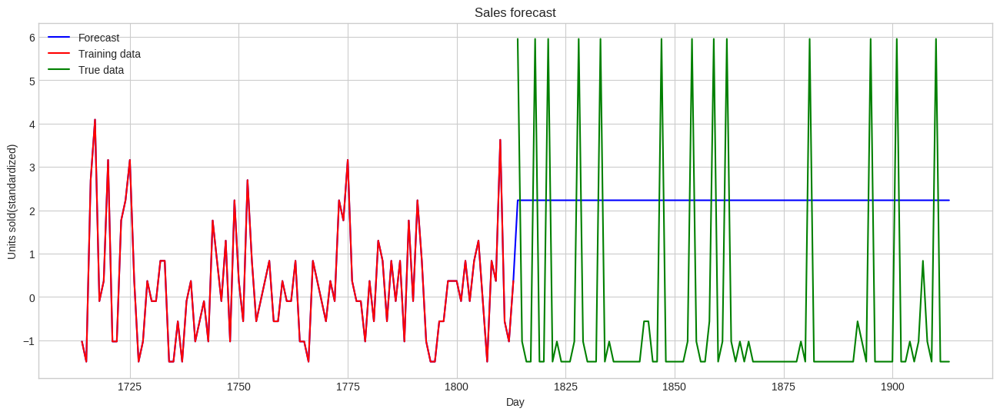

-----------------------------------------------------------------------------------------
| end of epoch   5 | time: 86.55s | valid loss 9.0896 | valid ppl  8863.00
-----------------------------------------------------------------------------------------
| epoch   6 |     2/   11 batches | lr 0.000100 | 9684.36 ms | loss 5.04343 | ppl   155.00
| epoch   6 |     4/   11 batches | lr 0.000100 | 7387.45 ms | loss 3.17671 | ppl    23.97
| epoch   6 |     6/   11 batches | lr 0.000100 | 7602.26 ms | loss 3.47313 | ppl    32.24
| epoch   6 |     8/   11 batches | lr 0.000100 | 7606.13 ms | loss 3.51169 | ppl    33.50
| epoch   6 |    10/   11 batches | lr 0.000100 | 7836.00 ms | loss 6.09150 | ppl   442.08
-----------------------------------------------------------------------------------------
| end of epoch   6 | time: 86.19s | valid loss 9.1161 | valid ppl  9101.05
-----------------------------------------------------------------------------------------
| epoch   7 |     2/   11 batches |

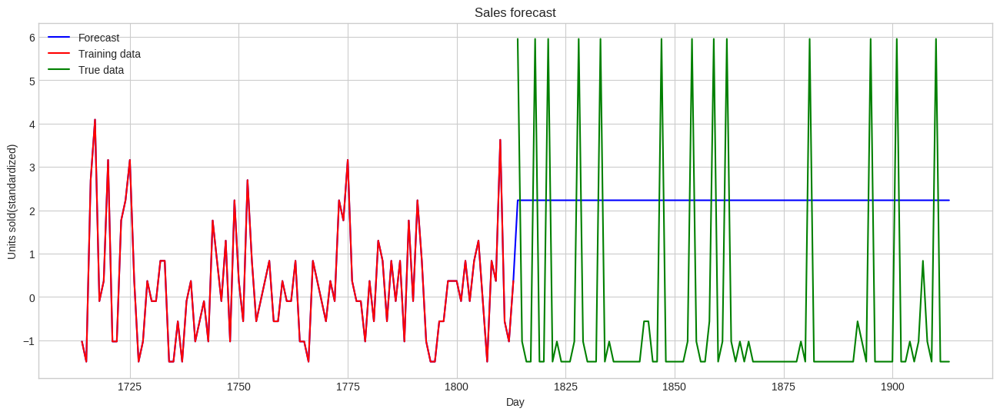

>>> Best model updated and saved (epoch 10)
-----------------------------------------------------------------------------------------
| end of epoch  10 | time: 89.35s | valid loss 8.8370 | valid ppl  6884.61
-----------------------------------------------------------------------------------------


In [ ]:
best_val_loss = float("inf")
batch_size = 64
epochs = 10  # Number of epochs
best_model = None
train_loss_list = []
val_loss_list = []

for epoch in range(1, epochs + 1):
    epoch_start_time = time.time()

    train_loss = TrainClassifier(train_data)
    train_loss_list.append(train_loss)

    if (epoch % 5 == 0):
        val_loss = plot_and_loss_classifier(model_classifier_weighted, val_data, epoch)
        predict_future_classifier(model_classifier_weighted, extracted_part, val_data, input_window, unique_vals)
    else:
        val_loss = evaluate_classifier(model_classifier_weighted, val_data)
    val_loss_list.append(val_loss)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        # torch.save(model_classifier.state_dict(), '/content/model/best_model_classifier')
        print(f">>> Best model updated and saved (epoch {epoch})")

    print('-' * 89)
    print('| end of epoch {:3d} | time: {:5.2f}s | valid loss {:5.4f} | valid ppl {:8.2f}'.format(
        epoch, (time.time() - epoch_start_time),
        val_loss, math.exp(val_loss)))
    print('-' * 89)


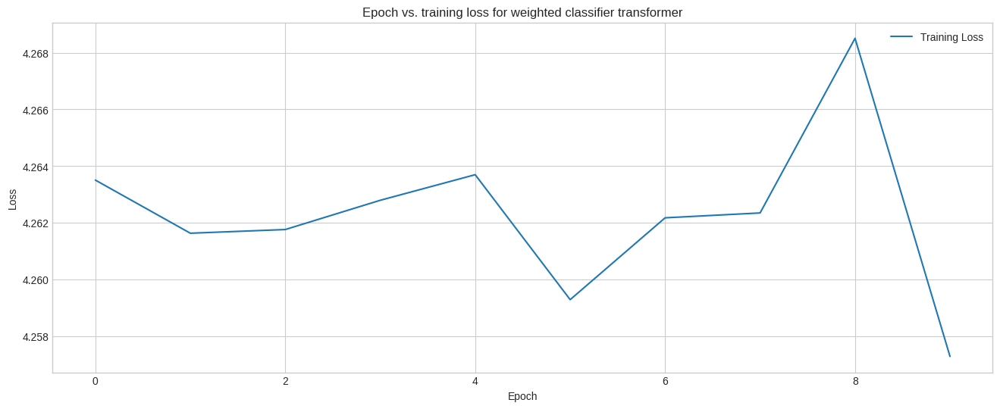

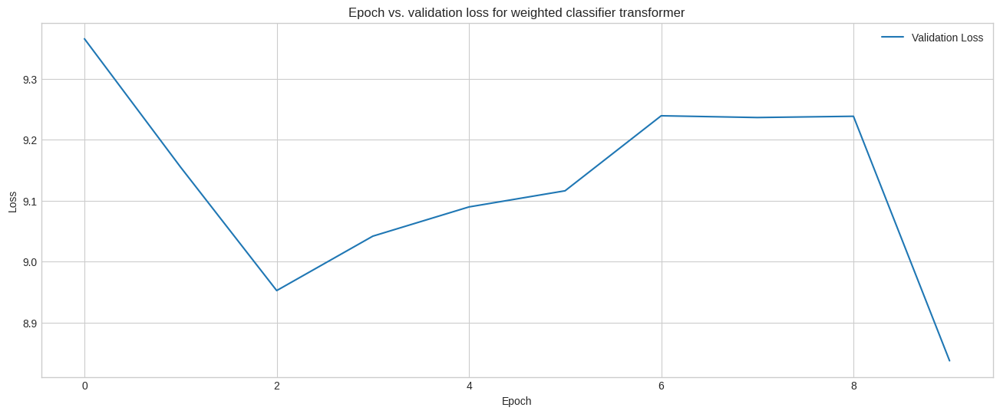

In [ ]:
# @title
plt.figure(figsize=(16, 6))
plt.plot(train_loss_list, label='Training Loss')
# plt.plot(np.arange(10), val_loss_list, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs. training loss for weighted classifier transformer')
plt.legend()
plt.show()

plt.figure(figsize=(16, 6))
# plt.plot(np.arange(10), train_loss_list, label='Training Loss')
plt.plot(val_loss_list, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs. validation loss for weighted classifier transformer')
plt.legend()
plt.show()

Challenges

* NaN Values: Initial attempts encountered NaNs in the input data, resolved by dropping problematic features (e.g., sell_price) and ensuring proper normalization.

* Computational Resources: Training a Transformer on long sequences is resource-intensive, necessitating the use of a subset of products.

* Even then, a transformer model any more complex than ours causing Google Colab to crash.

* Because the dataset doesn't have any easily recognizable trend and or seasonality, the transformer model was not able to be trained properly and ended up predicting a constant which is very close to the mean of the time series.

## Results
$$
\begin{array}{|c|c|c|}
\hline
Model & Remark \\
\hline
ARIMA  & Failed\ to\ Captured\ trend,\ missed\ sudden\ changes\\
Autoregressive\ Transformer & Predicted\ a\ constant\ value\ close\ to\ the\ mean.\\
Classifier\ Transformer & Predicted\ a\ constant\ value\ that\ is\ same\ as\ the\ majority\ class.\\
Weigted\ Classifier\ Transformer & Predicted\ a\ constant\ value\ that\ is\ same\ as\ the\ majority\ class.\\
\hline
\end{array}
$$

## Conclusion

Despite implementing both ARIMA and Transformer-based forecasting models, our results indicate that neither approach yielded strong predictive performance on the M5 dataset. While ARIMA provided a good baseline, its inability to incorporate known future inputs limited its effectiveness, particularly on such a sparse dataset. It should be noted that technical difficulties prevented us from implementing more complex ARIMA models that might have been better suited for this data. For instance, the memory limits of Google Colab prevented us from fitting models with a lag larger than 5, otherwise the kernel would crash. Thus the models were unable to learn autocorrelations in the time series from further than 5 days ago. An increase in system memory would allow the models to learn from the data more thoroughly, thus improving the accuracy of their forecasts.

The transformer model’s inclusion of exogenous variables like holidays and SNAP eligibility made it better suited for the volatile nature of retail sales.However, transformer models are more complex to implement and tune. They require careful selection and preprocessing of external features. Furthermore, their performance is sensitive to how well these variables correlate with the target.

During the project, we also implemented a weighted classification model, which  captured some of the underlying sales trends, However, we lost that result while preparing the report.

Limitations of our current analysis include:

* Focus on a single time series (one item-store pair)

* Limited scope of exogenous variables (e.g., no weather data or promotions beyond SNAP)

* Assumption of linearity in Transfer Function model

## Future Work

To build upon this analysis, future steps could include:

* Applying hierarchical time series modeling across all product categories

* Incorporating additional exogenous variables such as weather or competitor pricing

* Exploring advanced machine learning models like LSTM or Transformer-based networks [3]

* Evaluating ensemble models that combine ARIMA, SARIMAX, and deep learning approaches (with the appropriate amount of computational resources)

## Link to github repo:

[MTLSA25-Sales-Forecasting-Project](https://github.com/Legacy560/MTLSA25-Sales-Forecasting-Project)

### Bibliography

1. Kaggle. *M5 Forecasting - Accuracy Competition*. [https://www.kaggle.com/competitions/m5-forecasting-accuracy/data](https://www.kaggle.com/competitions/m5-forecasting-accuracy/data)  
2. Hyndman, R. J., & Athanasopoulos, G. (2018). *Forecasting: Principles and Practice*. OTexts.  
3. Lim, B., et al. (2021). *Time-series forecasting with deep learning: A survey*. Philosophical Transactions of the Royal Society A, 379(2194), 20200209.  
4. Box, G.E.P., Jenkins, G.M., Reinsel, G.C., & Ljung, G.M. (2015). *Time Series Analysis: Forecasting and Control*. Wiley.
